# World Happiness Index - EDA and Clustering

Este notebook es un breve análisis exploratorio del Índice de Felicidad Mundial para intentar comprender como ha sido su comportado en el tiempo, cuales son las diferencias que existen entre regiones y cuales son los determinantes que hacen a una Nación feliz. Se hará un especial énfasis en Colombia.

Para este análisis se usará la base de datos del World Index Report del año 2021 y otra con la información histórica del mismo.

World Happiness Report Official Website: https://worldhappiness.report/

### Importación de librerías necesarias

In [1]:
import numpy as np 
import pandas as pd

import warnings
warnings.filterwarnings("ignore")        

import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import ListedColormap
from matplotlib import cm

import seaborn as sns

import plotly.express as px

from pywaffle import Waffle

### Carga de información

In [2]:
# get data
df21 = pd.read_csv('data/world-happiness-report-2021.csv')
dfh = pd.read_csv('data/world-happiness-report.csv')
df08_21=pd.read_excel('data/WHI 2008-2021.xls')

# renaming columns for easier merge later
df21.rename(columns={'Country name': 'Country'}, inplace=True)
dfh.rename(columns={'Country name': 'Country', 'Life Ladder': 'Ladder score'}, inplace=True)
df08_21.rename(columns={'Country name': 'Country', 'Life Ladder': 'Ladder score'}, inplace=True)

# safety copies
safety_df21 = df21.copy()
safety_dfh = dfh.copy()
safefety_08_21 = df08_21.copy()

In [3]:
# font
plt.rcParams["font.family"] = 'sans serif'

# Exploración de Dataframes

In [4]:
df21.head()

,Country,Regional indicator,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
0,Finland,Western Europe,7.842,0.032,7.904,7.780,10.775,0.954,72.0,0.949,-0.098,0.186,2.43,1.446,1.106,0.741,0.691,0.124,0.481,3.253
1,Denmark,Western Europe,7.620,0.035,7.687,7.552,10.933,0.954,72.7,0.946,0.030,0.179,2.43,1.502,1.108,0.763,0.686,0.208,0.485,2.868
2,Switzerland,Western Europe,7.571,0.036,7.643,7.500,11.117,0.942,74.4,0.919,0.025,0.292,2.43,1.566,1.079,0.816,0.653,0.204,0.413,2.839
3,Iceland,Western Europe,7.554,0.059,7.670,7.438,10.878,0.983,73.0,0.955,0.160,0.673,2.43,1.482,1.172,0.772,0.698,0.293,0.170,2.967
4,Netherlands,Western Europe,7.464,0.027,7.518,7.410,10.932,0.942,72.4,0.913,0.175,0.338,2.43,1.501,1.079,0.753,0.647,0.302,0.384,2.798


In [5]:
df21.shape

(149, 20)

In [6]:
df21.info() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149 entries, 0 to 148
Data columns (total 20 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   Country                                     149 non-null    object 
 1   Regional indicator                          149 non-null    object 
 2   Ladder score                                149 non-null    float64
 3   Standard error of ladder score              149 non-null    float64
 4   upperwhisker                                149 non-null    float64
 5   lowerwhisker                                149 non-null    float64
 6   Logged GDP per capita                       149 non-null    float64
 7   Social support                              149 non-null    float64
 8   Healthy life expectancy                     149 non-null    float64
 9   Freedom to make life choices                149 non-null    float64
 10  Generosity    

In [7]:
df21.describe()

,Ladder score,Standard error of ladder score,upperwhisker,lowerwhisker,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption,Ladder score in Dystopia,Explained by: Log GDP per capita,Explained by: Social support,Explained by: Healthy life expectancy,Explained by: Freedom to make life choices,Explained by: Generosity,Explained by: Perceptions of corruption,Dystopia + residual
count,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,1.490000e+02,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000,149.000000
mean,5.532839,0.058752,5.648007,5.417631,9.432208,0.814745,64.992799,0.791597,-0.015134,0.727450,2.430000e+00,0.977161,0.793315,0.520161,0.498711,0.178047,0.135141,2.430329
std,1.073924,0.022001,1.054330,1.094879,1.158601,0.114889,6.762043,0.113332,0.150657,0.179226,5.347044e-15,0.404740,0.258871,0.213019,0.137888,0.098270,0.114361,0.537645
min,2.523000,0.026000,2.596000,2.449000,6.635000,0.463000,48.478000,0.382000,-0.288000,0.082000,2.430000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.648000
25%,4.852000,0.043000,4.991000,4.706000,8.541000,0.750000,59.802000,0.718000,-0.126000,0.667000,2.430000e+00,0.666000,0.647000,0.357000,0.409000,0.105000,0.060000,2.138000
50%,5.534000,0.054000,5.625000,5.413000,9.569000,0.832000,66.603000,0.804000,-0.036000,0.781000,2.430000e+00,1.025000,0.832000,0.571000,0.514000,0.164000,0.101000,2.509000
75%,6.255000,0.070000,6.344000,6.128000,10.421000,0.905000,69.600000,0.877000,0.079000,0.845000,2.430000e+00,1.323000,0.996000,0.665000,0.603000,0.239000,0.174000,2.794000
max,7.842000,0.173000,7.904000,7.780000,11.647000,0.983000,76.953000,0.970000,0.542000,0.939000,2.430000e+00,1.751000,1.172000,0.897000,0.716000,0.541000,0.547000,3.482000


El Índice más alto registrado es de 7.8, el más bajo es de 2.52.

# Análisis Gráfico

## Mapa Mundial
Primero, graficaremos un mapa mundial para dar un primer vistazo a la distribución global del Índice.

In [8]:
# geojson information found in https://geojson-maps.ash.ms/

# Change some countries names in order to match the geojson data
data = df21.copy()

data.loc[data.Country == 'Czech Republic', 'Country'] = "Czech Rep."
data.loc[data.Country == 'Czech Republic', 'Country'] = "Czech Rep."
data.loc[data.Country == 'Taiwan Province of China', 'Country'] = "Taiwan"
data.loc[data.Country == 'South Korea', 'Country'] = 'Korea'
data.loc[data.Country == 'Bosnia and Herzegovina', 'Country'] = "Bosnia and Herz."
data.loc[data.Country == 'Dominican Republic', 'Country'] = "Dominican Rep."
data.loc[data.Country == 'North Cyprus', 'Country'] = "Cyprus"
data.loc[data.Country == 'Congo (Brazzaville)', 'Country'] = "Congo"
data.loc[data.Country == 'Ivory Coast', 'Country'] = "Côte d'Ivoire"
data.loc[data.Country == 'North Macedonia', 'Country'] = "Macedonia"
data.loc[data.Country == 'Laos', 'Country'] = "Lao PDR"
data.loc[data.Country == 'Palestinian Territories', 'Country'] = 'Palestine'

# No in geo_word: 'Bahrain', 'Malta', 'Singapore', 'Mauritius', 'Hong Kong S.A.R. of China', 'Maldives', 'Comoros'

In [9]:
# Creating the necesary geojson file
# https://towardsdatascience.com/how-to-create-outstanding-custom-choropleth-maps-with-plotly-and-dash-49ac918a5f05

import json

# Loading geojson from (DATA_PATH depending on your local settings)
with open('custom.geo.json') as f:
    geo_world = json.load(f)

# Instanciating necessary lists
found = []
missing = []
countries_geo = []

# For simpler acces, setting "zone" as index in a temporary dataFrame
tmp = data.set_index('Country')

# Looping over the custom GeoJSON file
for country in geo_world['features']:
    
    # Country name detection
    country_name = country['properties']['name'] 
    
    # Checking if that country is in the dataset
    if country_name in tmp.index:
        
        # Adding country to our "Matched/found" countries
        found.append(country_name)
        
        # Getting information from both GeoJSON file and dataFrame
        geometry = country['geometry']
        
        # Adding 'id' information for further match between map and data 
        countries_geo.append({
            'type': 'Feature',
            'geometry': geometry,
            'id':country_name
        })
        
    # Else, adding the country to the missing countries
    else:
        missing.append(country_name)

# Displaying metrics
#print(f'Countries found: {len(found)} out of 149')
geo_world_ok = {'type': 'FeatureCollection', 'features': countries_geo}

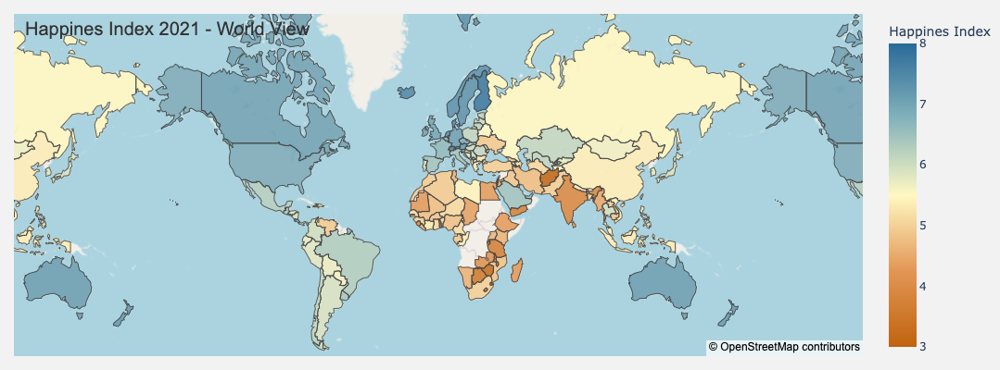

In [10]:
# Create figure
fig = px.choropleth_mapbox(
    data,
    geojson=geo_world_ok,
    locations='Country',
    color=data['Ladder score'],
    color_continuous_scale=['#c0630d', '#e29655', '#fff8c2','#84b3bb','#2a6a99'],
    range_color=(3, 8),
    mapbox_style='open-street-map', #there are more in mapbox
    zoom=0.35,
    center={'lat': 30, 'lon': 0},
    opacity=0.85,
    title='Happines Index 2021 - World View',
    labels={'Ladder score':'Happines Index'},
    height=400, #width=800
    
)

fig.update_layout(margin={"r":0,"t":15,"l":15,"b":15},
                  paper_bgcolor='#f2f2f2',
                  title_font_family='Arial',
                  title_font_color='#323232',
                  title_font_size=20,
                  title_x=0.025,
                  title_y=0.94,
                  #legend_font_family='Arial', 
                 )

# Display figure
fig.show()

<div style="text-align: justify">
El mapa nos evidencia unas claras diferencias entre continentes. África y Asia son las regiones con los menores índices, mientras que Europa y Norteamérica registran los más altos. Los puntajes de los países en cada continente son algo consistentes entre ellos, podemos observar 'continentes felices' y otros 'tristes' o menos felices.
</div>

## Índice de Felicidad por Región

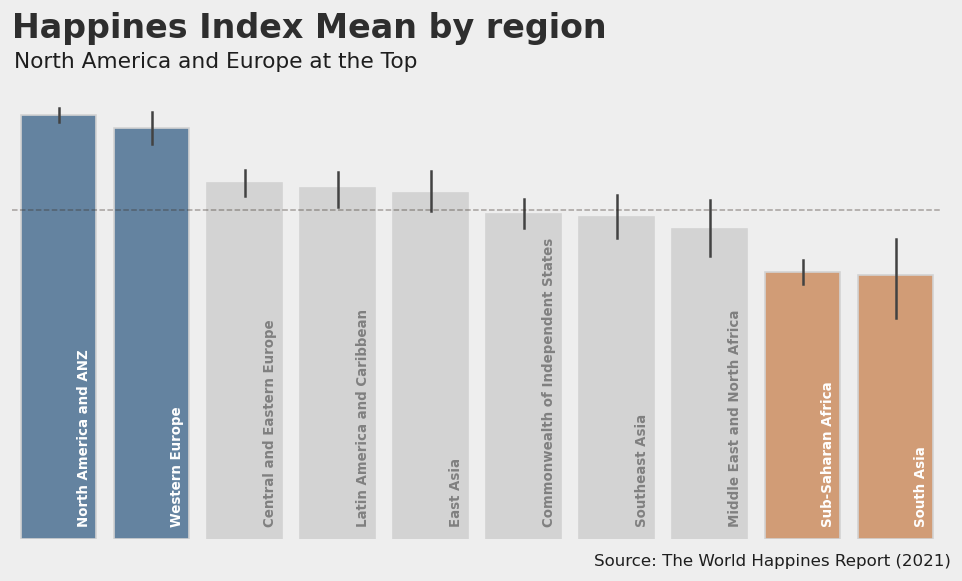

In [11]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c =  '#e09a67'

fig, ax = plt.subplots(1,1, figsize=(10, 5),dpi=120)
fig.patch.set_facecolor(background) # figure background color
ax.set_facecolor(background)
ax.set_frame_on(False)

# plots
regional_order = df21.groupby('Regional indicator')['Ladder score'].mean().sort_values(ascending=False).index

palette = ['lightgray' for i in regional_order]
palette[0] = palette[1] = high_c
palette[-1] = palette[-2] = low_c

color_text = ['gray' for i in regional_order]
color_text[0] = color_text[1] = color_text[-1] = color_text[-2] = 'white'


sns.barplot(x='Regional indicator', y='Ladder score', data=df21,
            ci=95,
            order=regional_order,
            palette=palette,
            edgecolor='lightgray',
            errwidth=1.5,
            #errcolor='gray'
           )

ax.axhline(y=data['Ladder score'].mean(), xmax=10, color='#362a22', linewidth=0.9, linestyle='--', alpha=0.4,)

for i in range(len(regional_order)):
    ax.annotate(regional_order[i], xy=(0.2+i, 0.25), fontweight='bold',
                fontfamily='sans serif',color=color_text[i], fontsize=8,rotation=90)

# title
plt.title('Happines Index Mean by region', pad=29, loc='left', color='#191919',
          fontfamily='sans serif', fontweight='bold', fontsize = 20, weight='bold', alpha=0.9)

ax.text(-0.48, 7.92, 'North America and Europe at the Top', 
        fontsize=13, fontweight='medium', fontfamily='sans serif',color='#1e1e1e')

fig.text(0.61, 0.08,'Source: The World Happines Report (2021)', ha='left',
        fontsize=10, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 


# Axis
ax.axes.get_xaxis().set_ticks([]) # errase the ticks on x ax
ax.set_xlabel(None)

ax.axes.get_yaxis().set_ticks([]) # errase the ticks on y ax
ax.set_ylabel(None)

fig.show()

<div style="text-align: justify">
Las regiones que registraron un índice de felicidad más alto son Norte América y Europa Occidental, los más bajos están en África Subsahariana y el sur de Asia.

Los intervalos de confianza nos permiten visualizar que casi la totalidad de los países de Latino América y el Caribe registran índices por encima de la media mundial. 
</div>

## ¿Cuáles son los países más felices y más tristes?

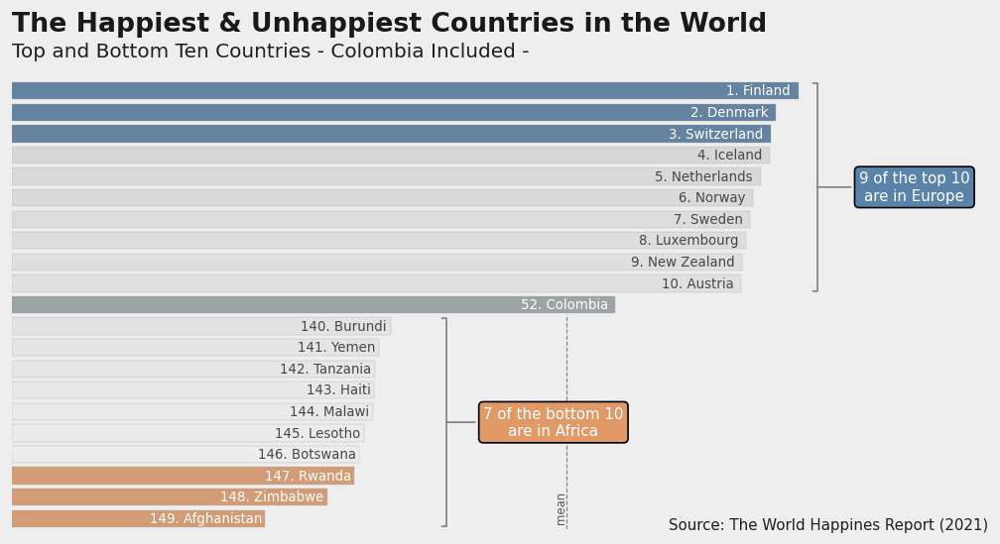

In [12]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c = '#e09a67'
neutral_c = '#9ba5a8'

fig, ax = plt.subplots(1,1, figsize=(10, 5),dpi=120)
fig.patch.set_facecolor(background) # figure background color
ax.set_facecolor(background)
ax.set_frame_on(False)

# data from top and bottom -Included Colombia-
col = df21[df21['Country']=='Colombia']
top_bottom = df21.head(10).append([col, df21.tail(10)])
top_bottom['Rank']= top_bottom.index + 1
top_bottom.reset_index(drop=True, inplace=True)

# palette
pal = (sns.light_palette('lightgrey', 21)).as_hex()
pal[0] = pal[1] = pal[2] =  low_c # color highlight
pal[-1] = pal[-2] = pal[-3] = high_c
pal[10] = neutral_c
pal = reversed(pal)

# plots
ax.axvline(x=df21['Ladder score'].mean(), color='#191919', linewidth=0.7, linestyle='--', alpha=0.5, ymax=0.48)

sns.barplot(x="Ladder score",y="Country",data=top_bottom,
            palette=pal, ax=ax, edgecolor='darkgray', linewidth=0.2)

# Countries names
color_text = ['#474747' for _ in range(len(top_bottom))]
color_text[0] = color_text[1] = color_text[2] = color_text[10] = color_text[-1] = color_text[-2] = color_text[-3] =  'white'

for i in range(len(top_bottom)):
    ax.annotate(str(top_bottom['Rank'][i])+'. '+top_bottom['Country'][i], 
                   xy=(top_bottom['Ladder score'][i]-(top_bottom['Ladder score'][i]*0.01), i), 
                   va = 'center', ha='right',fontweight='light',
                fontfamily='sans serif',color=color_text[i], fontsize=8,rotation=0)

# Text and annotations
Xstart, Xend = ax.get_xlim()
Ystart, Yend = ax.get_ylim()

ax.text(Xstart, Yend-2.3, 'The Happiest & Unhappiest Countries in the World', 
        fontsize=16, fontweight='bold', fontfamily='sans serif',color='#191919')

ax.text(Xstart, Yend-1.1, 'Top and Bottom Ten Countries - Colombia Included -', 
        fontsize=12, fontweight='light', fontfamily='sans serif',color='#1e1e1e')

ax.text(6.55, Ystart,'Source: The World Happines Report (2021)', ha='left',
        fontsize=9, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 


ax.text(df21['Ladder score'].mean()-0.12, Ystart-.4, 'mean', alpha=0.7, rotation='vertical',
        fontsize=7, fontfamily='sans serif',color='#191919')


ax.annotate('7 of the bottom 10\nare in Africa', xy=(4.3, Ystart-5), xytext=(5.4, Ystart-5), 
            fontsize=9, ha='center', va='center',fontfamily='sans serif',
            bbox=dict(boxstyle='round', fc=low_c),
            arrowprops=dict(arrowstyle='-[, widthB=7, lengthB=0.3', lw=1, color='gray'), color='white')

ax.annotate('9 of the top 10\nare in Europe', xy=(8, Yend+5), xytext=(9, Yend+5), 
            fontsize=9, ha='center', va='center',fontfamily='sans serif',
            bbox=dict(boxstyle='round', fc=high_c),
            arrowprops=dict(arrowstyle='-[, widthB=7, lengthB=0.3', lw=1, color='gray'), color='white')

# Ax
ax.axes.get_xaxis().set_ticks([]) # errase ticks on x
ax.tick_params(axis='x', labelsize=8, colors='grey')
ax.set(xlim=(0, 9.2))
ax.set(xlabel=None) # errase xlabel

ax.axes.get_yaxis().set_ticks([]) # errase ticks on y
ax.set(ylabel=None) # errase ylabel

fig.show()

Aunque las regiones con los índices promedio más bajos y altos registrados en el año 2021 son Sur Asia y Norte América, los países que encabezan la lista son mayormente europeos, mientras que en la parte baja la representación es mayormente del continente africano.  

Colombia se encuentra en el Rankin 52, con un puntaje por encima de la media mundial.

**Los países de América del Norte y Europa occidental son felices, los de Asia del sur son "tristes",  ¿qué pasa con los países de las regiones intermedias?**

In [13]:
# list of region sorted by regions Ladder score mean
regions = df21.groupby('Regional indicator').mean().sort_values(by='Ladder score', ascending=False).index.tolist()

def countries_by_region(r):
    countries_by_region = [df21[df21['Regional indicator']==region].sort_values(by='Ladder score', ascending=False).Country.tolist() for region in r]
    return countries_by_region

def scores_by_region(r):
    scores_by_region = [df21[df21['Regional indicator']==region].sort_values(by='Ladder score', ascending=False)['Ladder score'] for region in r]
    return scores_by_region


# create the colormap
ladder_min = df21['Ladder score'].min()
ladder_max = df21['Ladder score'].max()

norm = matplotlib.colors.Normalize(vmin=ladder_min, vmax=ladder_max)
my_colors = ['#e09a67', '#e8b693', '#edd2c0', '#bec9d7', '#8da5c0', '#5a83aa'] # https://vis4.net/palettes/#/6|d|5a83aa,eeeeee|eeeeee,e09a67|1|1

my_cmap = ListedColormap(my_colors)
my_mapper = cm.ScalarMappable(norm=norm, cmap=my_cmap)


# titles on graph
regions_titles = ['North America\nand ANZ',
 'Western\nEurope',
 'Central and\nEastern Europe',
 'Latin America\nand Caribbean',
 'East Asia',
 'Commonwealth of\nIndependent States',
 'Southeast Asia',
 'Middle East\nand North Africa',
 'Sub-Saharan\nAfrica',
 'South Asia']

# regions to cut from plot
cut_top=2
cut_bottom=-1

regions = regions[cut_top:cut_bottom]

countries_by_region = countries_by_region(regions)
scores_by_region = scores_by_region(regions)
regions_titles = regions_titles[cut_top:cut_bottom]


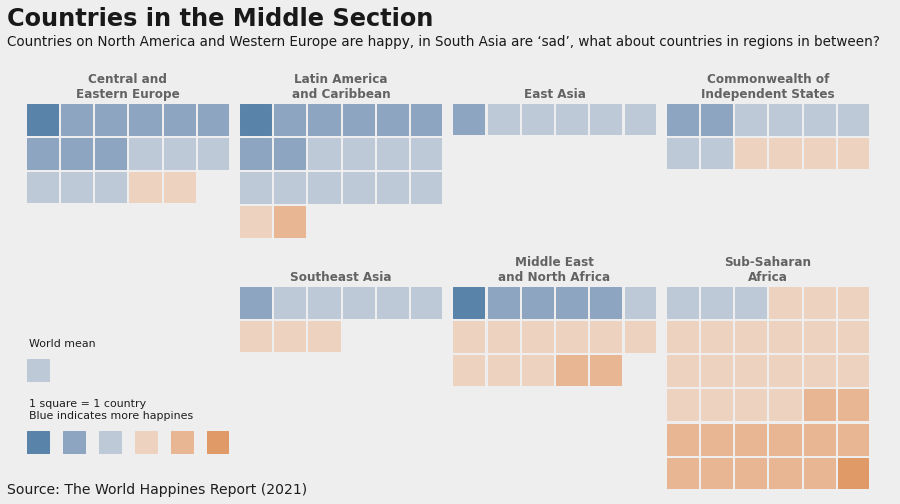

In [14]:
plots = {}
plot = 1
for reg in range(len(countries_by_region)):
    plots[('24'+str(plot))] = {
            'values': [1 for c in countries_by_region[reg]],
            'colors': [my_mapper.to_rgba(s) for s in scores_by_region[reg]],
            'starting_location': 'NW',   #  {'NW', 'SW', 'NE', 'SE'}
            'vertical': True,
            'plot_anchor':'N',
            'interval_ratio_x': 0.1,
            'interval_ratio_y': 0.1,
            'title': {
                'label': regions_titles[reg],
                'loc': 'center',
                'font': 'sans serif',
                'color': '#404040',
                'fontsize': 12,
                'fontweight': 'semibold',
                'alpha':0.8,
                'fontdict': {
                    #'verticalalignment':'center',
                },
                #'verticalalignment':'center',
            },     
        }
    if plot == 4:
        plot += 2
    else:
        plot +=1

# palette for 245
colors_plot245 = [background for _ in range(36)]
change = [1,7,13,19,25,31]
colors_plot245[33] = my_mapper.to_rgba(df21['Ladder score'].mean())
for i in change:
    colors_plot245[i] = my_colors[i//6]

plots['245'] = {
            'values': [1 for _ in range(36)],
            'colors': colors_plot245,
            'starting_location': 'SE',   #  {'NW', 'SW', 'NE', 'SE'}
            'vertical': False,
            'plot_anchor':'NE',  #The alignment method of subplots. {'C', 'SW', 'S', 'SE', 'E', 'NE', 'N', 'NW', 'W'}
            #'block_aspect_ratio': 1,
            'columns': 6,
            'interval_ratio_x': 0.6,
            'interval_ratio_y': 0.6,
            'title': {
                'label': '',
                'loc': 'center',
                'font': 'sans serif',
                'color': '#404040',
                'fontsize': 10,
                'fontweight': 'medium',
                'alpha':1
            },
}
        
fig = plt.figure(
    FigureClass=Waffle,
    plots=plots,
    columns=6,
    figsize=(12, 10)
)

fig.set_facecolor(background)

# Annotations
fig.text(-0.01, 1.05, 'Countries in the Middle Section', 
        fontsize=24, fontweight='bold', fontfamily='sans serif',color='#191919')

fig.text(-0.01, 1.023, '''Countries on North America and Western Europe are happy, in South Asia are ‘sad’, what about countries in regions in between?   ''',
         fontsize=13.5, fontweight='light', fontfamily='sans serif',color='#191919')

fig.text(0.015, 0.605,'World mean', ha='left',
        fontsize=11, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

fig.text(0.015, 0.505,'1 square = 1 country\nBlue indicates more happines', ha='left',
        fontsize=11, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

fig.text(-0.01, 0.4,'Source: The World Happines Report (2021)', ha='left',
        fontsize=14, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

fig.subplots_adjust(hspace=-0.72)

fig.show()

## ¿Cómo se relaciona el Índice de Felicidad con las métricas que lo componen?

In [15]:
from dominance_analysis import Dominance

dfvars = df21[['Ladder score', 'Logged GDP per capita', 'Social support', 'Healthy life expectancy', 
               'Freedom to make life choices', 'Perceptions of corruption', 'Generosity']]

dfvars = dfvars.rename(columns={'Ladder score': 'Happiness', 'Logged GDP per capita':'GDP PC',
                              'Social support':'Social Supp.', 'Healthy life expectancy':'Life Expec.', 
               'Freedom to make life choices':'Freedom', 'Perceptions of corruption':'Corruption'})

correlation = dfvars.corr()

dominance_regression = Dominance(data=dfvars,target='Happiness',objective=1)
incr_variable_rsquare = dominance_regression.incremental_rsquare()

variables = [key for key in incr_variable_rsquare]
importance = [incr_variable_rsquare[key]*100 for key in variables]

Loading BokehJS ...

  0%|          | 0/6 [00:00<?, ?it/s]

Selecting 6 Best Predictors for the Model
Selected Predictors :  ['GDP PC', 'Social Supp.', 'Life Expec.', 'Freedom', 'Corruption', 'Generosity']

********************  R-Squared of Complete Model :  ********************
R Squared : 0.7558471374226856

Selecting 6 Best Predictors for the Model
Selected Predictors :  ['GDP PC', 'Social Supp.', 'Life Expec.', 'Freedom', 'Corruption', 'Generosity']

Creating models for 63 possible combinations of 6 features :


100%|██████████| 5/5 [00:00<00:00, 1181.96it/s]

#########################  Model Training Done!!!!!  #########################

#########################  Calculating Variable Dominances  #########################
#########################  Variable Dominance Calculation Done!!!!!  #########################



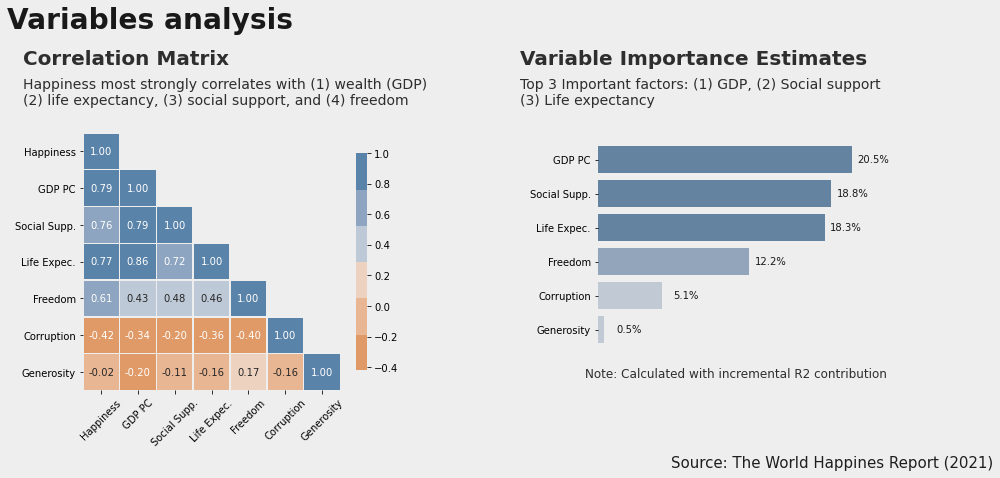

In [16]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c = '#e09a67'


fig, (ax1, ax2) = plt.subplots(1,2, figsize = (15,5))
fig.patch.set_facecolor(background) # figure background color


# Ax1
ax1.set_facecolor(background)

my_colors = ['#e09a67', '#e8b693', '#edd2c0', '#bec9d7', '#8da5c0', '#5a83aa'] # https://vis4.net/palettes/#/6|d|5a83aa,eeeeee|eeeeee,e09a67|1|1
mask = ~np.tril(np.ones_like(correlation, dtype=np.bool))

sns.heatmap(correlation, ax=ax1, cmap=my_colors, annot=True, fmt='.2f', 
            linewidth=0.5, linecolor=background, square = True, mask=mask, 
            cbar_kws={'shrink': .8},
           annot_kws={'size':10})

ax1.xaxis.set_tick_params(rotation=45,  )


# Ax2

# colors 
mini, maxi = min(importance), max(importance)
norm = matplotlib.colors.Normalize(vmax=maxi, vmin=mini)
colors = ['#bec9d7', '#8da5c0','#5a83aa']
my_cmap = ListedColormap(colors)
my_mapper = cm.ScalarMappable(norm=norm, cmap=my_cmap)
colors = [my_mapper.to_rgba(imp) for imp in importance]

bar = sns.barplot(x=importance, y=variables, ax=ax2, alpha=1,
           palette=colors)

for imp in range(len(importance)):
    ax2.annotate(str(round(importance[imp],1))+'%', 
                   xy=(importance[imp]+3, imp), 
                   va = 'center', ha='right',fontweight='medium',
                fontfamily='sans serif',color='#191919', fontsize=10,rotation=0)

ax2.set_xticks([])
ax2.set_xlim(0,26)
ax2.set_ylim(7,-1)
ax2.set_frame_on(False)


fig.text(0.055, 1.15, 'Variables analysis', 
        fontsize=28, fontweight='bold', fontfamily='sans serif',color='#191919')

fig.text(0.07, 1.05, 'Correlation Matrix', alpha=0.9,
         fontsize=20, fontweight='semibold', fontfamily='sans serif',color='#191919')

fig.text(0.07, 0.94, 'Happiness most strongly correlates with (1) wealth (GDP)\n(2) life expectancy, (3) social support, and (4) freedom', alpha=0.9,
         fontsize=14, fontweight='regular', fontfamily='sans serif',color='#191919')

fig.text(0.53, 1.05, 'Variable Importance Estimates', alpha=0.9,
         fontsize=20, fontweight='semibold', fontfamily='sans serif',color='#191919')

fig.text(0.53, 0.94, 'Top 3 Important factors: (1) GDP, (2) Social support\n(3) Life expectancy', alpha=0.9,
         fontsize=14, fontweight='regular', fontfamily='sans serif',color='#191919')

fig.text(0.59, 0.18, 'Note: Calculated with incremental R2 contribution', alpha=0.9,
         fontsize=12, fontweight='regular', fontfamily='sans serif',color='#191919')

fig.text(0.67, -0.07,'Source: The World Happines Report (2021)', ha='left',
        fontsize=15, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 


fig.subplots_adjust(
    #left=0.05,
    wspace=0.6)


<div style="text-align: justify">
Las variables que tienen una importancia estimada y se encuentran más correlacionadas con El Índice de felicidad son el ingreso per cápita, la expectativa de vida y el apoyo social. La generosidad no pareciera tener relevancia.
</div>

## Happines Score, Life Expectancy and GDP

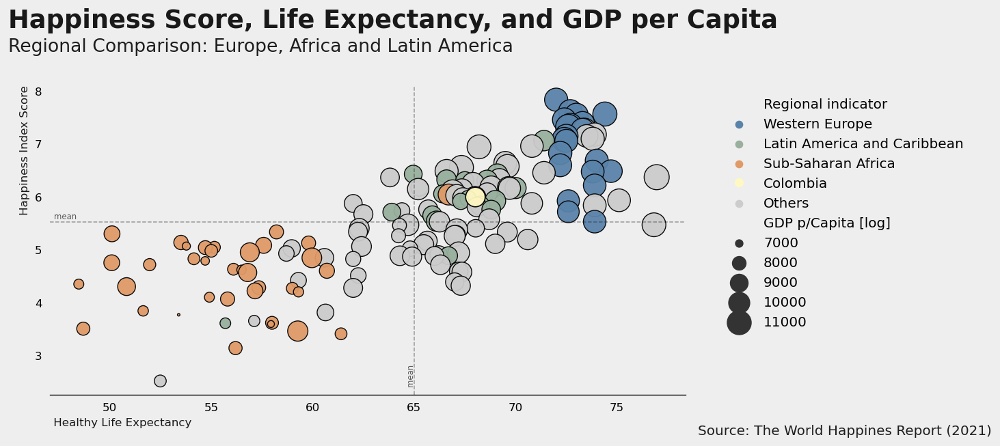

In [17]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c =  '#e09a67'
neutral_c = '#98b09d'
col_c = '#fff8c2'

fig, ax = plt.subplots(1,1, figsize=(10, 5),dpi=120)
fig.patch.set_facecolor(background) # figure background color
ax.set_facecolor(background)

palette = {'Western Europe':high_c,
           'North America and ANZ':'#cccccc',
           'Middle East and North Africa':'#cccccc',
           'Latin America and Caribbean':neutral_c,
           'Central and Eastern Europe':'#cccccc',
           'East Asia':'#cccccc',
           'Southeast Asia':'#cccccc',
           'Commonwealth of Independent States':'#cccccc',
           'Sub-Saharan Africa':low_c,
           'South Asia':'#cccccc'
}

# Create new palette and change name for regions with #cccccc for _name in dataframe
data = df21.copy()
new_name = {region: '_' + region if color == '#cccccc' else region for region, color in palette.items()}
new_name['South Asia'] = 'Others'
data['Regional indicator'] = data['Regional indicator'].map(new_name)
new_palette = {new_name[region]: color for region, color in palette.items()}

# Plots
sns.scatterplot(data=data, x='Healthy life expectancy', y='Ladder score',
                hue='Regional indicator',
                palette=new_palette, alpha=0.95, ec='black',
                size=data["Logged GDP per capita"] * 1000, legend=True, sizes=(5, 500))

sns.scatterplot(data=data[data['Country']=='Colombia'], x='Healthy life expectancy', y='Ladder score',
                color=col_c, alpha=0.95,ec='black',
                size=data["Logged GDP per capita"]*1000, linewidth=1,
                legend=False, sizes=(5, 500))

# mean
Ystart, Yend = ax.get_ylim()
Xstart, Xend = ax.get_xlim()

ax.axvline(x=data['Healthy life expectancy'].mean(),ymax=Yend, color='#191919', linewidth=0.9, linestyle='--', alpha=0.4)
ax.axhline(y=data['Ladder score'].mean(), xmax=Xend, color='#191919', linewidth=0.9, linestyle='--', alpha=0.4,)

ax.text(data['Healthy life expectancy'].mean()-0.4, Ystart+0.2, 'mean', alpha=0.7, rotation='vertical',
        fontsize=7, fontfamily='sans serif',color='#191919')

ax.text(Xstart+0.2, data['Ladder score'].mean()+.05, 'mean', alpha=0.7, #rotation='vertical',
        fontsize=7, fontfamily='sans serif',color='#191919')

# Axes
ax.set_xlabel(" Healthy Life Expectancy",fontfamily='sans serif',loc='left',color='#191919')
ax.set_ylabel("Happiness Index Score",fontfamily='sans serif',loc='top',color='#191919')
ax.tick_params(axis = 'both', which = 'major', labelsize = 10)

for s in ["top","right","left"]:
    ax.spines[s].set_visible(False)

ax.tick_params(axis='both', which='both',left=False, bottom=False,labelbottom=True)

# Text
ax.text(45,9.2,'Happiness Score, Life Expectancy, and GDP per Capita',
        fontfamily='sans serif',fontweight='bold',fontsize=22,weight='bold',color='#191919')

ax.text(45,8.75,'Regional Comparison: Europe, Africa and Latin America'
        ,fontfamily='sans serif',fontweight='light',fontsize=16,color='#1e1e1e')

ax.text(79, 1.5,'Source: The World Happines Report (2021)', ha='left',
        fontsize=12, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

# Legend
handles, labels = ax.get_legend_handles_labels()
col_label = Line2D([0], [0], marker='o', color=background, label='Colombia', markerfacecolor=col_c ,markersize=9)
handles.insert(4, col_label)

L = ax.legend(handles=handles, frameon=False,loc="upper center", bbox_to_anchor=(1.25, 1), ncol= 1, fontsize=12)
plt.setp(L.texts, family='sans serif')
L.get_texts()[6].set_text('GDP p/Capita [log]')
 
plt.show()

Podemos ver una fuerte relación lineal entre el índice de felicidad, la expectativa de vida y el ingreso perca pita. Los países más felices, son aquellos más ricos y que presentan una expectativa de vida mayor.

Los países latinoamericanos y del Caribe se posicionan en su mayoría, por encima de la media mundial. Colombia ocupa una posición intermedia comparado con sus vecinos.

## Corruption, Social Support and Happines Index

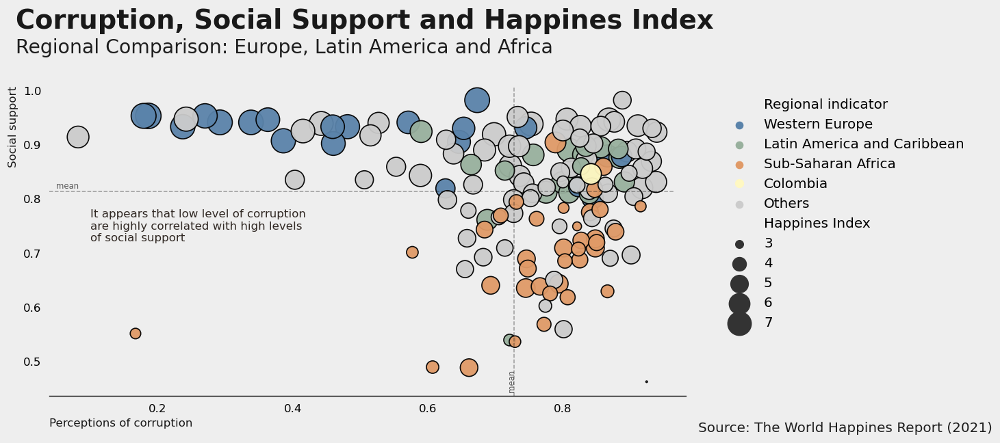

In [18]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c =  '#e09a67'
neutral_c = '#98b09d'
col_c = '#fff8c2'

fig, ax = plt.subplots(1,1, figsize=(10, 5),dpi=120)
fig.patch.set_facecolor(background) # figure background color
ax.set_facecolor(background)

palette = {'Western Europe':high_c,
           'North America and ANZ':'#cccccc',
           'Middle East and North Africa':'#cccccc',
           'Latin America and Caribbean':neutral_c,
           'Central and Eastern Europe':'#cccccc',
           'East Asia':'#cccccc',
           'Southeast Asia':'#cccccc',
           'Commonwealth of Independent States':'#cccccc',
           'Sub-Saharan Africa':low_c,
           'South Asia':'#cccccc'
}


# Create new palette and change name for regions with #cccccc for _name in dataframe
data = df21.copy()
new_name = {region: '_' + region if color == '#cccccc' else region for region, color in palette.items()}
new_name['South Asia'] = 'Others'
data['Regional indicator'] = data['Regional indicator'].map(new_name)
new_palette = {new_name[region]: color for region, color in palette.items()}

# Plots

sns.scatterplot(data=data, x='Perceptions of corruption', y='Social support',
                hue='Regional indicator',
                palette=new_palette, alpha=0.95, ec='black',
                size=data['Ladder score'], legend=True, sizes=(2, 500))

sns.scatterplot(data=data[data['Country']=='Colombia'], x='Perceptions of corruption', y='Social support',
                color=col_c, alpha=0.95,ec='black',
                size=data['Ladder score'], linewidth=1,
                legend=False, sizes=(2, 500))

# mean
Ystart, Yend = ax.get_ylim()
Xstart, Xend = ax.get_xlim()
ax.axvline(x=data['Perceptions of corruption'].mean(),ymax=Yend, color='#191919', linewidth=0.9, linestyle='--', alpha=0.4)
ax.axhline(y=data['Social support'].mean(), xmax=Xend, color='#191919', linewidth=0.9, linestyle='--', alpha=0.4,)

ax.text(data['Perceptions of corruption'].mean()-0.01, Ystart+0.01, 'mean', alpha=0.7, rotation='vertical',
        fontsize=7, fontfamily='sans serif',color='#191919')

ax.text(Xstart+0.01, data['Social support'].mean()+.005, 'mean', alpha=0.7,
        fontsize=7, fontfamily='sans serif',color='#191919')

# Axes
ax.set_xlabel('Perceptions of corruption',fontfamily='sans serif',loc='left',color='#191919')
ax.set_ylabel('Social support',fontfamily='sans serif',loc='top',color='#191919')
ax.tick_params(axis = 'both', which = 'major', labelsize = 10)

for s in ["top","right","left"]:
    ax.spines[s].set_visible(False)

ax.tick_params(axis='both', which='both',left=False, bottom=False,labelbottom=True)

# Text 
ax.text(-0.01,1.115,'Corruption, Social Support and Happines Index',
        fontfamily='sans serif',fontweight='bold',fontsize=23,weight='bold',color='#191919')

ax.text(-0.01,1.07,'Regional Comparison: Europe, Latin America and Africa'
        ,fontfamily='sans serif',fontweight='light',fontsize=17,color='#1e1e1e')

ax.text(1, 0.37,'Source: The World Happines Report (2021)', ha='left',
        fontsize=12, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 


ax.text(0.1,0.7,
'''
It appears that low level of corruption
are highly correlated with high levels
of social support
''',fontfamily='sans serif',fontsize=10,color='#302823')

# Legend
handles, labels = ax.get_legend_handles_labels()
col_label = Line2D([0], [0], marker='o', color=background, label='Colombia', markerfacecolor=col_c ,markersize=9)
handles.insert(4, col_label)

L = ax.legend(handles=handles, frameon=False,loc="upper center", bbox_to_anchor=(1.25, 1), ncol= 1, fontsize=12)
plt.setp(L.texts, family='sans serif')
L.get_texts()[6].set_text('Happines Index')

plt.show()

Con una excepción (Rwanda), los países con una baja percepción en la corrupción, presentan los niveles más altos de apoyo social y son a su vez, los más felices. Los más tristes tienen bajos niveles de apoyo social y una alta percepción de corrupción.

Colombia es uno de los países de Latinoamérica con mayor percepción de corrupción.

## Freedom to Make Choices, Social Support and Happines Index

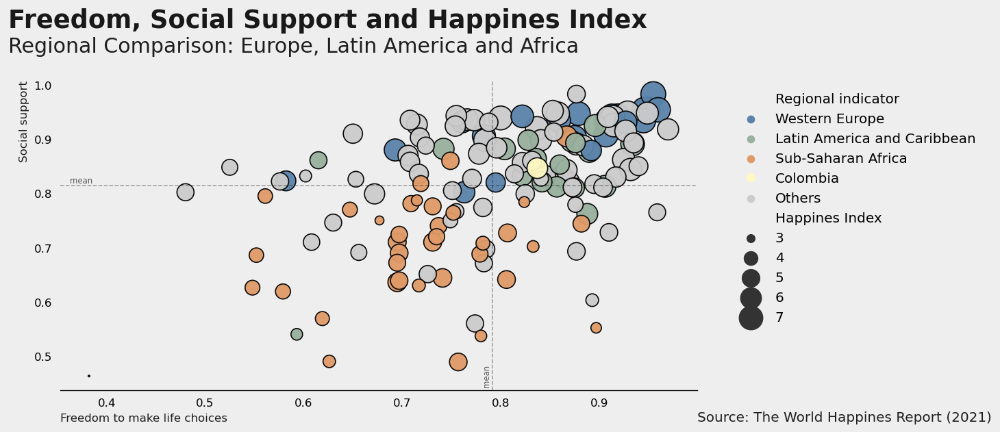

In [19]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c =  '#e09a67'
neutral_c = '#98b09d'
col_c = '#fff8c2'

fig, ax = plt.subplots(1,1, figsize=(10, 5),dpi=120)
fig.patch.set_facecolor(background) # figure background color
ax.set_facecolor(background)

palette = {'Western Europe':high_c,
           'North America and ANZ':'#cccccc',
           'Middle East and North Africa':'#cccccc',
           'Latin America and Caribbean':neutral_c,
           'Central and Eastern Europe':'#cccccc',
           'East Asia':'#cccccc',
           'Southeast Asia':'#cccccc',
           'Commonwealth of Independent States':'#cccccc',
           'Sub-Saharan Africa':low_c,
           'South Asia':'#cccccc'
}


# Create new palette and change name for regions with #cccccc for _name in dataframe
data = df21.copy()
new_name = {region: '_' + region if color == '#cccccc' else region for region, color in palette.items()}
new_name['South Asia'] = 'Others'
data['Regional indicator'] = data['Regional indicator'].map(new_name)
new_palette = {new_name[region]: color for region, color in palette.items()}

# Plots

#sns.regplot(data=data, x='Freedom to make life choices', y='Social support', scatter=False, order=2,
#           line_kws={'lw':0.6, 'color': 'gray', 'linestyle':'--'}
#           )

sns.scatterplot(data=data, x='Freedom to make life choices', y='Social support',
                hue='Regional indicator',
                palette=new_palette, alpha=0.95, ec='black',
                size=data['Ladder score'], legend=True, sizes=(2, 500))

sns.scatterplot(data=data[data['Country']=='Colombia'], x='Freedom to make life choices', y='Social support',
                color=col_c, alpha=0.95,ec='black',
                size=data['Ladder score'], linewidth=1,
                legend=False, sizes=(2, 500))

# mean
Ystart, Yend = ax.get_ylim()
Xstart, Xend = ax.get_xlim()
ax.axvline(x=data['Freedom to make life choices'].mean(),ymax=Yend, color='#191919', linewidth=0.9, linestyle='--', alpha=0.4)
ax.axhline(y=data['Social support'].mean(), xmax=Xend, color='#191919', linewidth=0.9, linestyle='--', alpha=0.4,)

ax.text(data['Freedom to make life choices'].mean()-0.01, Ystart+0.01, 'mean', alpha=0.7, rotation='vertical',
        fontsize=7, fontfamily='sans serif',color='#191919')

ax.text(Xstart+0.01, data['Social support'].mean()+.005, 'mean', alpha=0.7, #rotation='vertical',
        fontsize=7, fontfamily='sans serif',color='#191919')

# Axes
ax.set_xlabel('Freedom to make life choices',fontfamily='sans serif',loc='left',color='#1e1e1e')
ax.set_ylabel('Social support',fontfamily='sans serif',loc='top',color='#1e1e1e')
ax.tick_params(axis = 'both', which = 'major', labelsize = 10)

for s in ["top","right","left"]:
    ax.spines[s].set_visible(False)

ax.tick_params(axis='both', which='both',left=False, bottom=False,labelbottom=True)

# Text
ax.text(0.3, 1.106,'Freedom, Social Support and Happines Index',
        fontfamily='sans serif',fontweight='bold',fontsize=22,weight='bold',color='#191919')

ax.text(0.3 ,1.06,'Regional Comparison: Europe, Latin America and Africa',
        fontfamily='sans serif',fontweight='light',fontsize=18,color='#1e1e1e')

ax.text(1, 0.38,'Source: The World Happines Report (2021)', ha='left',
        fontsize=12, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

# Legend
handles, labels = ax.get_legend_handles_labels()
col_label = Line2D([0], [0], marker='o', color=background, label='Colombia', markerfacecolor=col_c ,markersize=9)
handles.insert(4, col_label)

L = ax.legend(handles=handles, frameon=False,loc="upper center", bbox_to_anchor=(1.25, 1), ncol= 1, fontsize=12)
plt.setp(L.texts, family='sans serif')
L.get_texts()[6].set_text('Happines Index')
 
fig.show()

Podemos ver una fuerte relación lineal entre el índice de felicidad (Tamaño del circulo), el apoyo social y la libertad para tomar decisiones, los países más felices son aquellos con estas dos métricas altas.

Las métricas de apoyo social y libertad para tomar decisiones de vida en Colombia se encuentran por encima de la media mundial, esto se repite para cada uno de las métricas que componen al Índice.

## Comportamiento del índice en el tiempo
**Año 2021, un periodo de retroceso.**

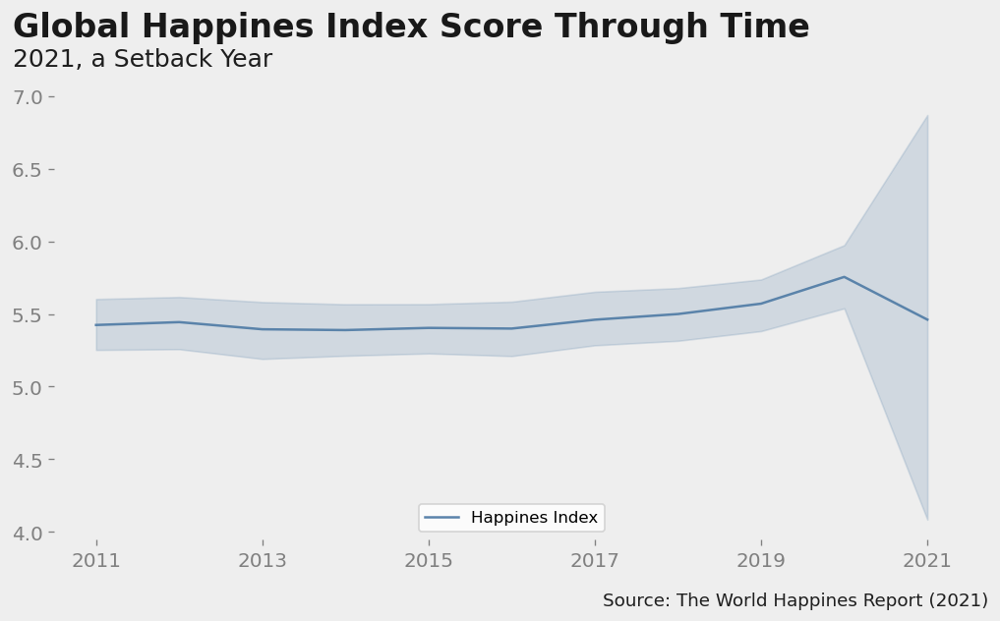

In [20]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c = '#e09a67'
neutral_c = '#9ba5a8'

fig, ax = plt.subplots(1,1, figsize=(10, 5),dpi=120)
fig.patch.set_facecolor(background) # figure background color
ax.set_facecolor(background)
ax.set_frame_on(False)

df11_21 = df08_21[df08_21['year'] >= 2011]

# plot
sns.lineplot(x='year', y='Ladder score', data= df11_21,
            ci=95, color=high_c)

# Ax
ax.tick_params(axis='both', labelsize=12, colors='grey')
ax.set(xlabel=None) # errase xlabel
ax.set_xticks(np.arange(2011,2022,2))

ax.set_yticks(np.arange(4,7.5,.5))
ax.set(ylabel=None) # errase ylabel
#ax.set_ylim(3.5,7)

Xstart, Xend = ax.get_xlim()
Ystart, Yend = ax.get_ylim()

ax.text(Xstart-0.5, Yend+0.4, 'Global Happines Index Score Through Time', 
        fontsize=20, fontweight='bold', fontfamily='sans serif',color='#191919')

ax.text(Xstart-0.5, Yend+0.195, '2021, a Setback Year', 
        fontsize=15, fontweight='light', fontfamily='sans serif',color='#1e1e1e')

ax.text(Xend-4.4, Ystart-0.45,'Source: The World Happines Report (2021)', ha='left',
        fontsize=11, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

ax.legend(labels=['Happines Index'], loc='lower center')

fig.show()

El índice global de felicidad, el cual venía en ascenso los últimos años, tuvo un retroceso en el año 2021, esto probablemente como consecuencia de la Pandemia del COVID-19. Parece ser que tardó casi dos años desde su aparición en causar los mayores efectos negativos sobre la felicidad de la población mundial.

La ampliación del intervalo de confianza en el último año, sugiere que la afectación fue dispar a lo largo de la muestra de países, unos países alcanzaron niveles más altos de felicidad, mientras que otros sufrieron fuertes caídas. Estos último jalonaron la media hacía abajo.

In [21]:
df19 = df08_21[df08_21.year==2019]
df19.set_index('Country', inplace=True)

temp = df21.copy()
temp['Score 2019'] = 0
temp.set_index('Country', inplace=True)

for country in df19.index:
    temp.loc[country, 'Score 2019'] = temp.loc[country, 'Ladder score'] - df19.loc[country, 'Ladder score']

total =len(temp)
perc_negatives = round(len(temp[temp['Score 2019']<0])/total*100, 1)
perc_positives = round(len(temp[temp['Score 2019']>0])/total*100, 1)
perc_equal = round(100-perc_negatives-perc_positives, 1)

change = pd.DataFrame({'Decrease': [perc_negatives],
                  'Increase': [perc_positives],
                   'Equal': [perc_equal]},
                  index=['Change 2019-2021'])

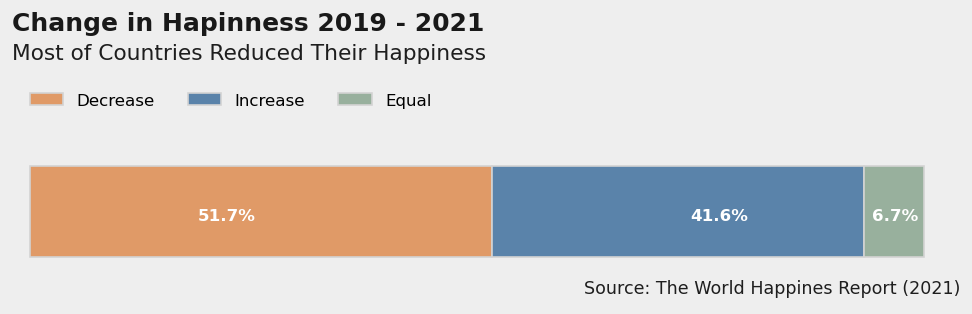

In [22]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c = '#e09a67'
neutral_c = '#98b09d'

fig, ax = plt.subplots(1,1, figsize=(10, 5),dpi=120)
fig.patch.set_facecolor(background) # figure background color
ax.set_facecolor(background)
ax.set_frame_on(False)

change.plot(kind='barh', stacked=True, color=[low_c, high_c, neutral_c], ax=ax, figsize=(10, 2),
            legend=True, xlim=(-2, 102), edgecolor='lightgrey')

ax.set_yticks([])
ax.set_xticks([])

ax.legend(loc='upper left', frameon=False, 
         borderpad = 0, bbox_to_anchor = (0.01, 1.2), ncol = 3, fontsize=10)

ax.text(-2, 1, 'Change in Hapinness 2019 - 2021', 
        fontsize=15, fontweight='bold', fontfamily='sans serif',color='#191919')

ax.text(-2, 0.84, 'Most of Countries Reduced Their Happiness', 
        fontsize=13, fontweight='light', fontfamily='sans serif',color='#1e1e1e')

ax.text(62, -0.45,'Source: The World Happines Report (2021)', ha='left',
        fontsize=10.5, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

plt.figtext(0.28, 0.465, str(perc_negatives)+'%', fontsize = 10, fontname = 'sans serif', fontweight='semibold', color = 'white')
plt.figtext(0.69, 0.465, str(perc_positives)+'%', fontsize = 10, fontname = 'sans serif', fontweight='semibold', color = 'white')
plt.figtext(0.842, 0.465, str(perc_equal)+'%', fontsize = 10, fontname = 'sans serif', fontweight='semibold', color = 'white')

fig.show()

<div style="text-align: justify">
El 51.7% de los países alcanzaron un nivel de felicidad menor en el año 2021 comparado con el 2019. El 41.6% mejoraron su medición y el 6.7% se mantuvo en el mismo nivel.
</div>

## Comportamiento de las métricas del WHR en el tiempo
**A pesar de la pandemia, todas las métricas que componen al índice son mejores que hace diez años**

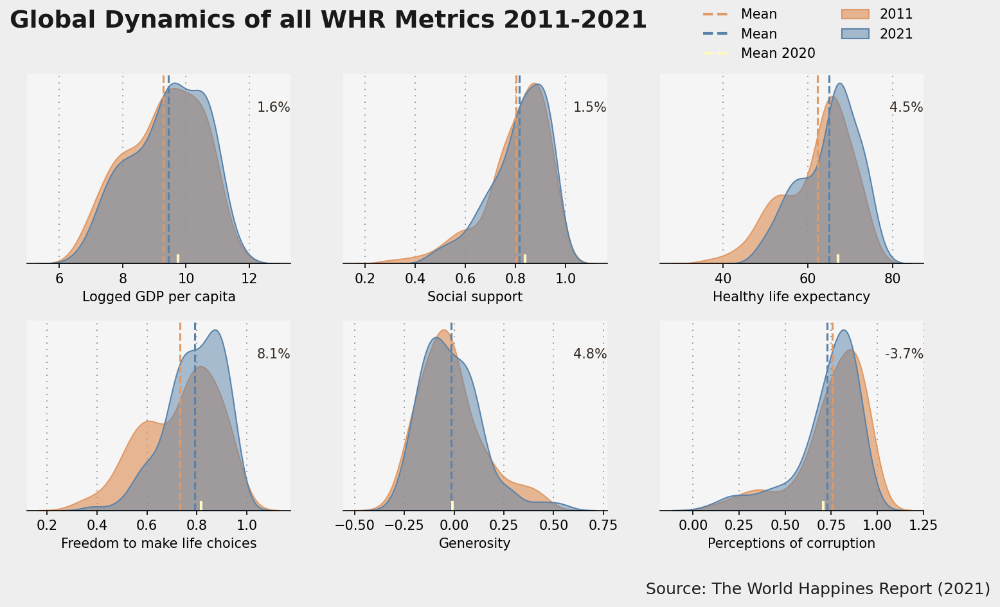

In [23]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c =  '#e09a67'
neutral_c = '#fff8c2'


fig = plt.figure(figsize=(12, 6), dpi=150,facecolor=background)
gs = fig.add_gridspec(2, 3)
gs.update(wspace=0.2, hspace=0.3)


plot = 0
for row in range(0, 2):
    for col in range(0, 3):
        locals()["ax"+str(plot)] = fig.add_subplot(gs[row, col])
        locals()["ax"+str(plot)].set_facecolor('#f5f5f5')
        locals()["ax"+str(plot)].tick_params(axis='y', left=False)
        locals()["ax"+str(plot)].get_yaxis().set_visible(False)
        locals()["ax"+str(plot)].set_axisbelow(True)
        for s in ["top","right","left"]:
            locals()["ax"+str(plot)].spines[s].set_visible(False)
        plot += 1

# Rename columns in dfh
tempdfh = dfh.rename(columns={'Log GDP per capita': 'Logged GDP per capita',
                   'Healthy life expectancy at birth': 'Healthy life expectancy'})

# Variables to plot
variables = ['Logged GDP per capita',
 'Social support',
 'Healthy life expectancy',
 'Freedom to make life choices',
 'Generosity',
 'Perceptions of corruption']

plot = 0
for variable in variables:
    
    sns.kdeplot(tempdfh.query("year == 2011")[variable], ax=locals()["ax"+str(plot)],
                    color = low_c, shade = True, label = '2011', alpha = 0.7) 
    
    locals()["ax"+str(plot)].axvline(tempdfh.query("year == 2011")[variable].mean(), linestyle = '--', color = low_c)
    
    sns.kdeplot(df21[variable], ax=locals()["ax"+str(plot)],
                color = high_c, shade = True, label = '2021', alpha = 0.5)
    
    locals()["ax"+str(plot)].axvline(df21[variable].mean(), linestyle = '--', color = high_c)    
    
    locals()["ax"+str(plot)].axvline(tempdfh.query("year == 2020")[variable].mean(), ymax=0.05, linewidth= 2, linestyle = '--', color = neutral_c)

    Xstart, Xend = locals()["ax"+str(plot)].get_xlim()
    Ystart, Yend = locals()["ax"+str(plot)].get_ylim()
    
    # annotations
    locals()["ax"+str(plot)].text(Xend, Yend*(4/5), 
             str(round(df21[variable].mean()*100/tempdfh.query("year == 2011")[variable].mean()-100, 1)) + '%',
            ha='right', fontname = 'sans serif', fontsize = 10, color ='#362a22')
    
    # grid and ax
    locals()["ax"+str(plot)].grid(which='major', axis='x', zorder=0, color='gray', linestyle=':', dashes=(1,5))
    locals()["ax"+str(plot)].set_xlabel(variable, fontfamily='sans serif')
    plot += 1

fig.text(0.11, 0.96,'Global Dynamics of all WHR Metrics 2011-2021',
        fontfamily='sans serif',fontweight='bold',fontsize=18,weight='bold',color='#191919')

fig.text(0.66, -0.02,'Source: The World Happines Report (2021)', ha='left',
        fontsize=12, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 
    
leg = ax1.legend(['Mean', 'Mean', 'Mean 2020','2011', '2021'], loc=3, bbox_to_anchor = (1.4, 1.12), ncol = 2,
                   borderpad = -1.2, frameon = False, fontsize = 10)

for line in leg.get_lines():
    line.set_linewidth(2)

fig.show()

Si comparamos la media los años 2020 y 2021, podemos observar una caída en cada uno de las métricas asociadas al índice de felicidad.

Sin embargo, si miramos el espacio temporal de los últimos diez años entre 2011 y 2021, las métricas han mejorado (la mejora en la percepción de la corrupción está representada en un descenso de su métrica), esto parece indicarnos que, a pesar de las afectaciones negativas provocadas por la pandemia, en la actualidad hay mayores niveles de renta per cápita, apoyo social, expectativa de vida, libertad de tomar decisiones, generosidad y mejor percepción frente a la corrupción que hace diez años.

## Países más felices y más tristes a través del tiempo

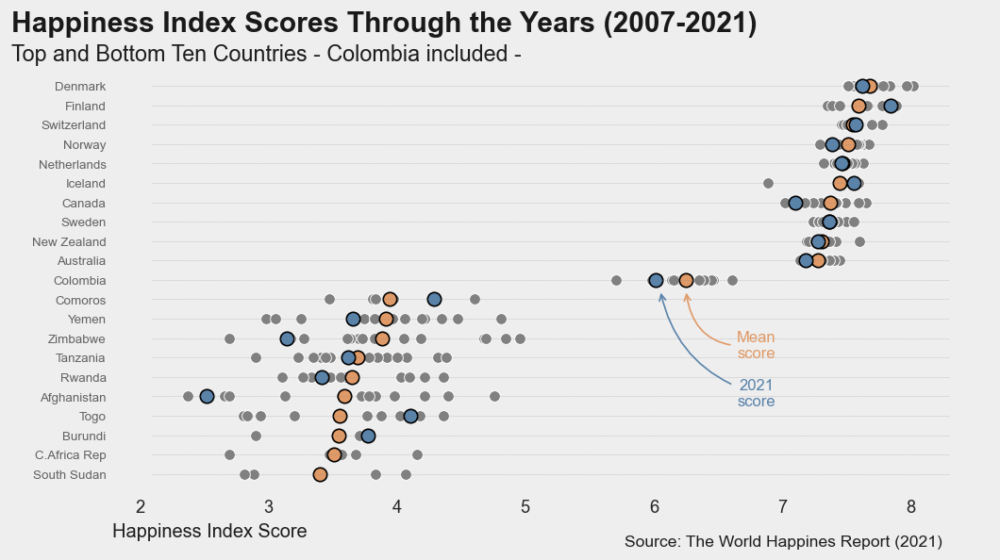

In [40]:
# Reduced list as too many to show all at once and adding Colombia
top_bottom = dfh.groupby('Country')['Ladder score'].mean().sort_values(
    ascending=False).sort_values(ascending=False).reset_index()
colombia = top_bottom[top_bottom['Country']=='Colombia']
top_bottom_historic = (top_bottom[:10].append([top_bottom[-10:],colombia])).sort_values(by='Ladder score',ascending=True)
top_bottom_historic['Rank'] = top_bottom_historic.index + 1
top_bottom_historic.reset_index(drop=True, inplace=True)

background = '#eeeeee'
high_c = '#5a83aa'
neutral_c = '#98b09d'  #'#d88546' #'#8fc961' green
low_c = '#e09a67'

fig, ax = plt.subplots(1,1, figsize=(10, 5),dpi=120)
fig.patch.set_facecolor(background) # figure background color
ax.set_facecolor(background)

# Plots
plot = 1
for country in top_bottom_historic['Country']:
    # countries means
    mean = dfh[dfh['Country'] == country].groupby('Country')['Ladder score'].mean()
    # historic scores
    sns.scatterplot(data=dfh[dfh['Country'] == country], y=plot, x='Ladder score',color='grey',s=50,ax=ax)
    # mean score
    sns.scatterplot(data=dfh[dfh['Country'] == country], y=plot, x=mean,color=low_c,ec='black',linewidth=1,s=75,ax=ax)
    #2021 score
    sns.scatterplot(data=df21[df21['Country'] == country], y=plot, x='Ladder score',color=high_c,ec='black',linewidth=1,s=75,ax=ax)   
    plot += 1
    

# rename Central African Republic for graphing purposes
top_bottom_historic.iloc[1, df21.columns.get_loc('Country')] = 'C.Africa Rep'

# Axes
ax.set_yticks(top_bottom_historic.index+1)
ax.set_yticklabels(top_bottom_historic['Country'], fontdict={'horizontalalignment': 'right', 'fontsize': 8}, alpha=0.7)
ax.tick_params(axis=u'both', which=u'both',length=0)
ax.set_xlabel('Happiness Index Score',fontfamily='sans serif',loc='left',color='#1e1e1e')

for s in ['top','right','bottom','left']:
    ax.spines[s].set_visible(False)

Xstart, Xend = ax.get_xlim()
Ystart, Yend = ax.get_ylim()

ax.hlines(y=top_bottom_historic.index+1, xmin=Xstart, xmax=Xend, color='gray', alpha=0.5, linewidth=.3, linestyles='--')
ax.set_axisbelow(True)

# Title
ax.text(1, Yend+1.8, 'Happiness Index Scores Through the Years (2007-2021)', 
        fontsize=18, fontweight='bold', fontfamily='sans serif',color='#191919')

ax.text(1, Yend+0.3,'Top and Bottom Ten Countries - Colombia included -', 
        fontsize=14, fontweight='light', fontfamily='sans serif',color='#1e1e1e')

ax.text(5.77, Ystart-2.7,'Source: The World Happines Report (2021)', ha='left',
        fontsize=10.5, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

# Annotations
plt.annotate('2021\nscore', xy=(6.05, 10.5), xytext=(6.8, 4.5),
             arrowprops=dict(
                 color=high_c,
                 arrowstyle="->",
                 connectionstyle="arc3,rad=-.3"
             ), 
             fontsize=10,fontfamily='sans serif',ha='center', color=high_c)

plt.annotate('Mean\nscore', xy=(6.25, 10.5), xytext=(6.8, 7),
             arrowprops=dict(
                 color=low_c,
                 arrowstyle="->",
                 connectionstyle="arc3,rad=-.5"
             ),
             fontsize=10,fontfamily='sans serif',ha='center', color=low_c)

fig.show()

Si observamos a los diez países que históricamente han tenido los índices de felicidad más altos, podemos notar que suelen ser consistentes en el tiempo, aunque se encuentran cerca de los niveles más bajos que han registrado desde el año 2007, no difieren mucho de su puntuación media, a excepción de Canadá que se encuentra por debajo y Finlandia, la cual presentó uno de sus índices más altos registrados anteriormente.

Los países con índices más bajos en el tiempo tienen más variabilidad en sus resultados. Afganistán es el país con la peor puntuación, la segunda más bajas registrada desde el 2007, solo por encima de su propia puntuación registrada durante otro año.

Desde el año 2007, los países de la parte baja de la tabla son mayormente africanos, mientras que los de la parte alta son Europeos de nuevo, esto nos muestra que los resultados del 2021 vistos anteriormente, más que circunstanciales, parecieran adaptarse a un patrón en el tiempo.

Colombia también se muestra consistente en el tiempo, llama la atención que el año 2021 presentó una de las mediciones más bajas que ha registrado.

## ¿Cuantos países han ocupado los primero y últimos 3 puestos?

In [25]:
years = sorted(df08_21.year.unique())

countries_in_data = len(df08_21['Country'].unique())

lasts3 = [list(df08_21[df08_21['year']==year].sort_values(by='Ladder score').head(3).Country) for year in years]
differents_lasts3 = len(set([x for l in lasts3 for x in l]))

firsts3 = [list(df08_21[df08_21['year']==year].sort_values(by='Ladder score').tail(3).Country) for year in years]
differents_firsts3 = len(set([x for l in firsts3 for x in l]))

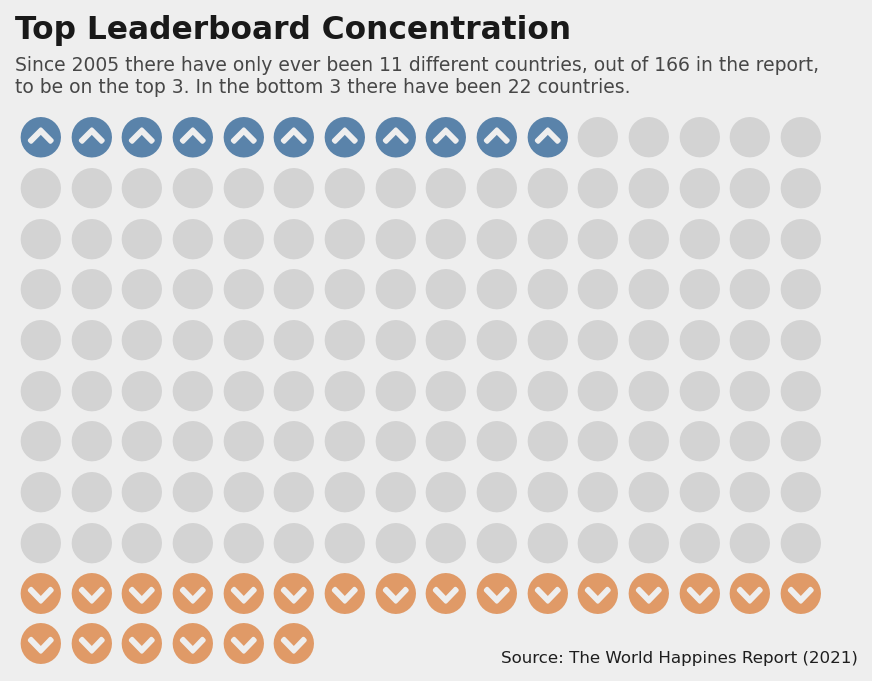

In [26]:
fig = plt.figure(figsize=(12, 4),dpi=150,facecolor=background,
    FigureClass=Waffle,
    rows=11,
    values=[differents_firsts3, countries_in_data-differents_firsts3-differents_lasts3, differents_lasts3],
    colors=[high_c, "lightgray", low_c],
    icons=['chevron-circle-up', 'circle', 'chevron-circle-down'],
    font_size=20,
    vertical=True,
    starting_location= 'NW',
)

fig.text(0.01, 1.08,'Top Leaderboard Concentration',
        fontfamily='sans serif',fontweight='bold',fontsize=15,weight='bold',color='#191919')
    
fig.text(0.01, 0.99,'''
Since 2005 there have only ever been 11 different countries, out of 166 in the report,
to be on the top 3. In the bottom 3 there have been 22 countries.''', 
        fontsize=9, fontweight='light', fontfamily='sans serif',color='#474747')

fig.text(0.28, 0.04,'Source: The World Happines Report (2021)', ha='left',
        fontsize=8, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

fig.show()

<div style="text-align: justify">
Desde el año 2005, solo 11 países diferentes han ocupado el top 3 de la clasificación, lo que sugiere una concentración en la cima. 22 países han ocupado los tres puestos más bajos.
</div>

## ¿Qué pasa con las regiones?

In [27]:
df2011 = dfh[dfh.year == 2011]
df2011['Regional indicator'] = 'u'

for i in range(len(df2011)):
    for j in range(len(df21)):
        if df2011.iloc[i,0] == df21.iloc[j,0]:
            df2011.iloc[i,11] = df21.iloc[j,1]
            
index_regional_21 = df21.groupby('Regional indicator').agg({'Ladder score': 'mean'}).reset_index()
index_regional_21['year'] = 2021

index_regional_11 = df2011[df2011['Regional indicator'] != 'u'].groupby('Regional indicator').agg({'Ladder score': 'mean'}).reset_index()
index_regional_11['year'] = 2011
index_regional_dynamics = pd.concat([index_regional_11, index_regional_21], ignore_index = True)

latinamerica_11 = df2011[df2011['Regional indicator'] == 'Latin America and Caribbean'][['Country', 'Ladder score', 'year']].reset_index(drop=True)

latinamerica_21 = df21[df21['Regional indicator'] == 'Latin America and Caribbean'][['Country', 'Ladder score']].reset_index(drop=True)
latinamerica_21['year'] = 2021

latinamerica_dynamics = pd.concat([latinamerica_11, latinamerica_21], ignore_index = True)

to_drop = ['Haiti', 'Uruguay', 'Bolivia','Dominican Republic', 'Nicaragua']

latinamerica_dynamics = latinamerica_dynamics[~latinamerica_dynamics['Country'].isin(to_drop)].reset_index(drop=True)

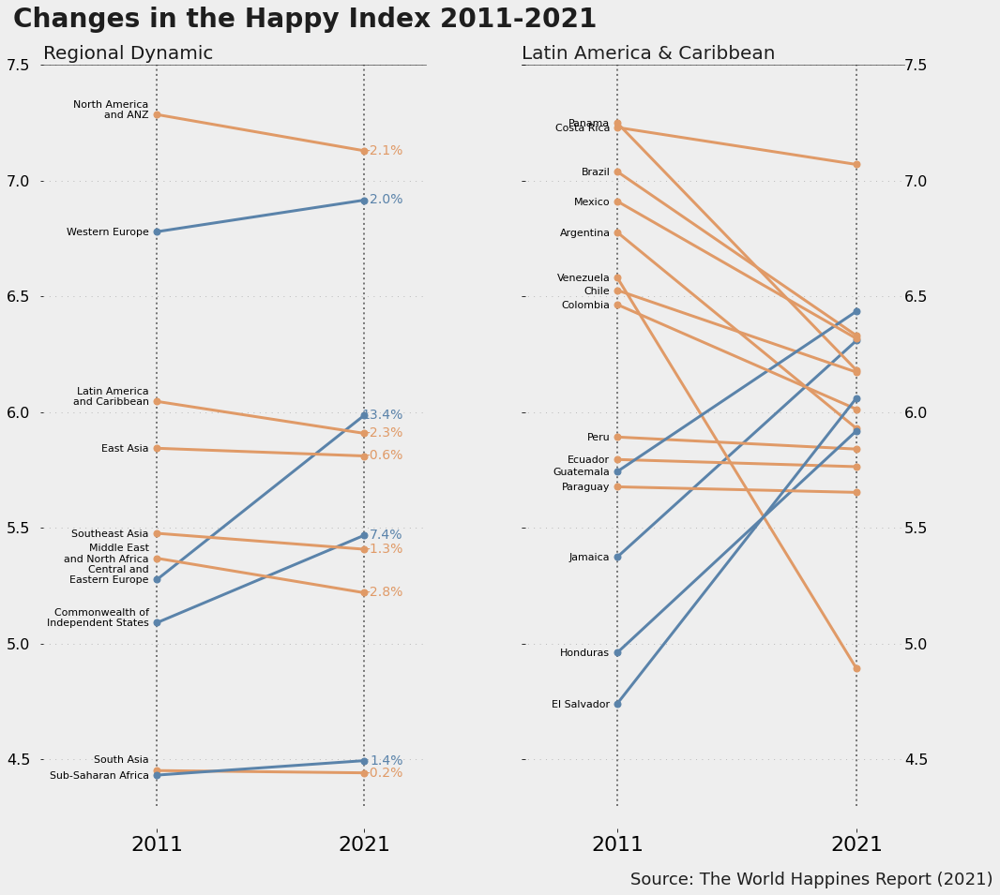

In [28]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c = '#e09a67'


fig, (ax1, ax2) = plt.subplots(1,2, figsize = (15,15))
fig.patch.set_facecolor(background) # figure background color


# Ax1
ax1.set_facecolor(background)

regions = index_regional_21['Regional indicator'].to_list()

labels = ['Central and\nEastern Europe',
 'Commonwealth of\nIndependent States',
 'East Asia',
 'Latin America\nand Caribbean',
 'Middle East\nand North Africa',
 'North America\nand ANZ',
 'South Asia\n',
 'Southeast Asia',
 'Sub-Saharan Africa',
 'Western Europe']

for region in range (len(regions)):
    reg = index_regional_dynamics[index_regional_dynamics['Regional indicator'] == regions[region]]
    reg.index = range(2)
    color = high_c if reg.iloc[1,1] > reg.iloc[0,1] else low_c
    ax1.plot(reg['year'], reg['Ladder score'], marker = 'o', markersize = 7, linewidth = 3, color = color)
    ax1.text(reg['year'].values[0]-0.4, reg['Ladder score'].values[0]-0.015, labels[region], ha = 'right', fontname = 'sans serif', fontsize = 11)
    ax1.text(reg['year'].values[1]+1.9, reg['Ladder score'].values[1]-0.015,
             str(round((reg.iloc[1,1]*100/reg.iloc[0,1]) - 100, 1)) + '%',
             ha='right', fontname = 'sans serif', fontsize = 14, color = color)

ax1.vlines(x = 2011, ymin = 4.3, ymax = 7.5, color = 'black', alpha = 0.5, linewidth = 2, linestyles = ':')
ax1.vlines(x = 2021, ymin = 4.3, ymax = 7.5, color = 'black', alpha = 0.5, linewidth = 2, linestyles = ':')   

for i in ['right', 'left', 'bottom',]:
    ax1.spines[i].set_visible(False)
ax1.spines['top'].set_alpha(0.6)

ax1.tick_params(axis='y', labelsize=16, labelleft=True, pad=10)
ax1.set_ylim(4.2,7.5)

ax1.set_xlim(2005.5,2024)
ax1.set_xticks([2011, 2021])
ax1.tick_params(axis='x', labelsize=22)
ax1.grid(color = 'gray', linestyle = ':', axis = 'y', alpha = 0.7, zorder = 0,  dashes = (1,7))

ax1.set_title('Regional Dynamic', fontdict={'fontsize':20, 'color':'#191919'}
              , loc='left', y=1.0)

# Ax2 
ax2.set_facecolor(background)

countries = set(latinamerica_dynamics['Country'].to_list())

for c in countries:
    country = latinamerica_dynamics[latinamerica_dynamics['Country'] == c]        
    country.index = range(2)
    color = high_c if country.iloc[1,1] > country.iloc[0,1] else low_c
    ax2.plot(country['year'], country['Ladder score'], marker = 'o', markersize = 7, linewidth = 3, color = color)
    ax2.text(country['year'].values[0]-0.3, country['Ladder score'].values[0]-0.015, c, ha = 'right', fontname = 'sans serif', fontsize = 11)
       
ax2.vlines(x = 2011, ymin = 4.3, ymax = 7.5, color = 'black', alpha = 0.5, linewidth = 2, linestyles = ':')
ax2.vlines(x = 2021, ymin = 4.3, ymax = 7.5, color = 'black', alpha = 0.5, linewidth = 2, linestyles = ':')   

for i in ['right', 'left', 'bottom']:
    ax2.spines[i].set_visible(False)
ax2.spines['top'].set_alpha(0.6)
#ax2.spines['left'].set_linestyle('dashed')

ax2.set_xlim(2007,2023)
ax2.set_xticks([2011, 2021])
ax2.tick_params(axis='x', labelsize=22)
ax2.grid(color = 'gray', linestyle = ':', axis = 'y', alpha = 0.7, zorder = 0,  dashes = (1,7))

ax2.tick_params(axis='y', direction='in', labelsize=16, labelleft=False, labelright=True, pad=0)
ax2.set_ylim(4.2,7.5)

ax2.set_title('Latin America & Caribbean', fontdict={'fontsize':20, 'color':'#1e1e1e', }
              , loc='left', y=1.0)

fig.text(0.02,0.917, 'Changes in the Happy Index 2011-2021', color = '#1e1e1e',
            fontweight='bold', fontsize = 28, fontname = 'sans serif')

fig.text(0.63, 0.07,'Source: The World Happines Report (2021)', ha='left',
        fontsize=18, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 


fig.subplots_adjust(
    left=0.05,
    wspace=0.25)

fig.show()

Comparado con el año 2011, las regiones que hoy son más felices son Europa, África Subsahariana y los Estados Independientes, estos últimos han registrado las alzas más altas (7.4%). El resto de regiones ha disminuido su puntuación, incluso Norte América, no obstante, permanece en el primer lugar.

Latino América y el Caribe han disminuido su registro un -2.3% respecto a hace diez años. Llama la atención que este descenso es generado por la caída en los países de América del Sur, mientras que los países del Caribe han incrementado su puntuación. El país más feliz de la región en el año 2021 es Costa Rica.

## Colombia en el tiempo

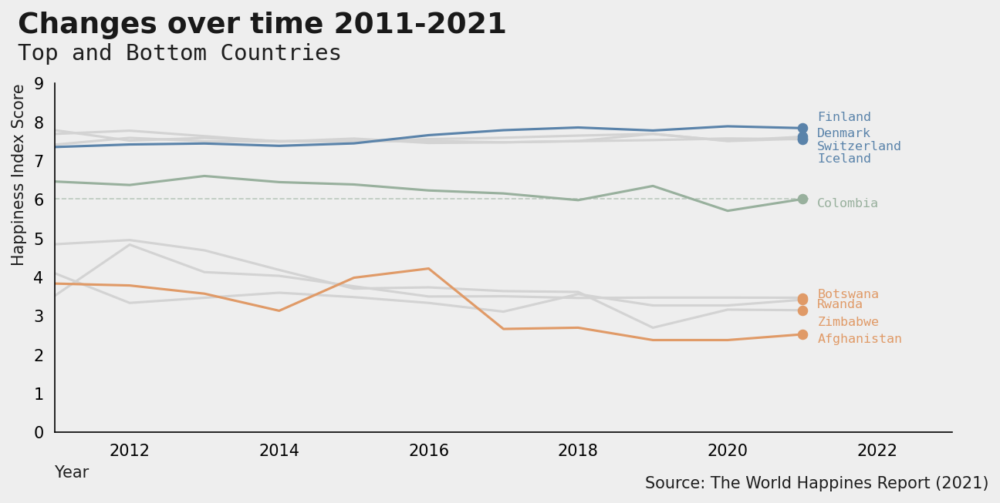

In [29]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c =  '#e09a67'
neutral_c = '#98b09d'
col_c = '#fff8c2'

fig = plt.figure(figsize=(10, 4), dpi=150,facecolor=background)
gs = fig.add_gridspec(1, 1)
gs.update(wspace=0, hspace=0)
ax0 = fig.add_subplot(gs[0, 0])
ax0.set_facecolor(background)
for s in ["right", "top"]:
    ax0.spines[s].set_visible(False)
    
ax0.set_xlabel("Year",fontfamily='sans serif',loc='left',color='#1e1e1e')
ax0.set_ylabel("Happiness Index Score",fontfamily='sans serif',loc='top',color='#1e1e1e')
ax0.tick_params(axis = 'both', which = 'major', labelsize = 10)
    
ax0.tick_params(axis='both', which='both', left=False, bottom=False,labelbottom=True) 

# plots

# lows and highs
highs = list(df21.iloc[1:4,0])
lows = list(df21.iloc[-4:-1,0])
lh = lows + highs

for countrie in lh:
    sns.lineplot(ax=ax0,data=df08_21[(df08_21['Country']==countrie)], x='year', y='Ladder score',color='lightgray')

# highest:
sns.lineplot(ax=ax0,data=df08_21[(df08_21['Country']==df21.iloc[0,0])], x='year', y='Ladder score',color=high_c)    

# lowest:
sns.lineplot(ax=ax0,data=df08_21[(df08_21['Country']==df21.iloc[-1,0])], x='year', y='Ladder score',color=low_c)

# Colombia
sns.lineplot(ax=ax0,data=df08_21[(df08_21['Country']=='Colombia')], x='year', y='Ladder score',color=neutral_c)
ax0.axhline(y=df08_21[(df08_21['Country']=='Colombia')]['Ladder score'].iloc[-1], xmax=0.84, color=neutral_c, linewidth=0.8, linestyle='--', alpha=0.6,)


Xstart, Xend = ax0.get_xlim()
Ystart, Yend = ax0.get_ylim()

# markers
for countrie in highs:
    ax0.plot(2021,df08_21[(df08_21['Country']==countrie)]['Ladder score'].reset_index().iloc[-1,-1], 'ko', markersize=5, fillstyle='full',color=high_c, markeredgewidth=1.5)

for countrie in lows:
    ax0.plot(2021,df08_21[(df08_21['Country']==countrie)]['Ladder score'].reset_index().iloc[-1,-1], 'ko', markersize=5, fillstyle='full',color=low_c, markeredgewidth=1.5)

# markers highest    
ax0.plot(2021,df08_21[(df08_21['Country']==df21.iloc[0,0])]['Ladder score'].reset_index().iloc[-1,-1], 'ko', markersize=5, fillstyle='full',color=high_c, markeredgewidth=1.5)

# markers lowest
ax0.plot(2021,df08_21[(df08_21['Country']==df21.iloc[-1,0])]['Ladder score'].reset_index().iloc[-1,-1], 'ko', markersize=5, fillstyle='full',color=low_c, markeredgewidth=1.5)

# marker Colombia
ax0.plot(2021,df08_21[(df08_21['Country']=='Colombia')]['Ladder score'].reset_index().iloc[-1,-1], 'ko', markersize=5, fillstyle='full',color=neutral_c, markeredgewidth=1.5)

# names
for i in range(len(highs)):    
    ax0.text(2021.2,df08_21[(df08_21['Country']==highs[i])]['Ladder score'].reset_index().iloc[-1,-1]-0.3*(i),highs[i],color=high_c,fontfamily='monospace',fontsize=8, rotation=0)

for i in range(len(lows)):    
    ax0.text(2021.2,df08_21[(df08_21['Country']==lows[i])]['Ladder score'].reset_index().iloc[-1,-1]-0.2*(i),lows[i],color=low_c,fontfamily='monospace',fontsize=8, rotation=0)

# highest name
ax0.text(2021.2,df08_21[(df08_21['Country']==df21.iloc[0,0])]['Ladder score'].reset_index().iloc[-1,-1]+0.2,df21.iloc[0,0],color=high_c,fontfamily='monospace',fontsize=8, rotation=0)

# lowest name
ax0.text(2021.2,df08_21[(df08_21['Country']==df21.iloc[-1,0])]['Ladder score'].reset_index().iloc[-1,-1]-0.2,df21.iloc[-1,0],color=low_c,fontfamily='monospace',fontsize=8, rotation=0)

# Colombia name
ax0.text(2021.2,df08_21[(df08_21['Country']=='Colombia')]['Ladder score'].reset_index().iloc[-1,-1]-0.2,'Colombia',color=neutral_c,fontfamily='monospace',fontsize=8, rotation=0)

ax0.yaxis.set_ticks(np.arange(0, 10, 1))
ax0.set_xlim(left = 2011, right = 2023)
plt.xticks(fontname = 'sans serif')
plt.yticks(fontname = 'sans serif')

Xstart, Xend = ax0.get_xlim()
Ystart, Yend = ax0.get_ylim()


ax0.text(Xstart-.5, Yend+1.3, 'Changes over time 2011-2021', fontsize=18, fontweight='bold',
         fontfamily='sans serif',color='#191919')

ax0.text(Xstart-.5, Yend+0.6, 'Top and Bottom Countries', fontsize=14, fontweight='light',
         fontfamily='monospace',color='#1e1e1e')

ax0.text(Xend-4.1, Ystart-1.45,'Source: The World Happines Report (2021)', ha='left',
        fontsize=10, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

fig.show()

Los países más felices parecen mantenerse en el tiempo, mientras que los de índices más bajos, pareciera que están peor.

Esta grafica nos confirma de nuevo que Colombia se encuentra en uno de los niveles más bajos de los últimos años.

## Comparación Colombia vs primero y último

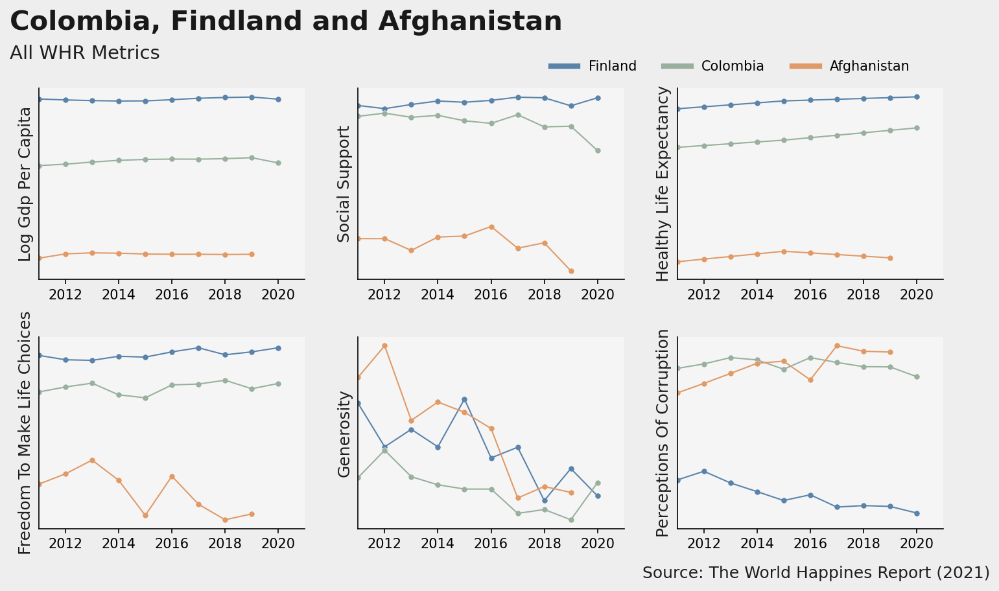

In [30]:
background = '#eeeeee'
high_c = '#5a83aa'
low_c =  '#e09a67'
neutral_c = '#98b09d'

fig = plt.figure(figsize=(12, 6), dpi=150,facecolor=background)
gs = fig.add_gridspec(2, 3)
gs.update(wspace=0.2, hspace=0.3)

plot = 0
for row in range(0, 2):
    for col in range(0, 3):
        locals()['ax'+str(plot)] = fig.add_subplot(gs[row, col])
        locals()['ax'+str(plot)].set_facecolor('#f5f5f5')
        for s in ['top','right']:
            locals()['ax'+str(plot)].spines[s].set_visible(False)
        plot += 1

# Rename columns in dfh
df08_21.rename(columns={'Healthy life expectancy at birth': 'Healthy life expectancy'},
              inplace=True)
        
# Variables to plot
variables = ['Log GDP per capita',
 'Social support',
 'Healthy life expectancy',
 'Freedom to make life choices',
 'Generosity',
 'Perceptions of corruption']

# Countries to plot
countries = ['Finland', 'Colombia', 'Afghanistan']
colors = {'Colombia': neutral_c, 'Finland': high_c, 'Afghanistan':low_c }

plot = 0
for variable in variables:
    for countrie in countries:

        sns.lineplot(x='year', y=variable, data=df08_21[df08_21['Country'] == countrie],
                     color=colors[countrie], ci=None, ax=locals()["ax"+str(plot)], linewidth=1)
        
        sns.scatterplot(x='year', y=variable, data=df08_21[df08_21['Country'] == countrie],
                        color=colors[countrie], ci=None, ax=locals()["ax"+str(plot)], s=20)
    
    locals()['ax'+str(plot)].set_xlabel(None)
    locals()['ax'+str(plot)].set_yticks([])
    locals()['ax'+str(plot)].set_xlim(2011,2021)
    locals()['ax'+str(plot)].set_ylabel(variable.title(),fontfamily='sans serif', color='#1e1e1e', fontsize=12)
    plot += 1


fig.text(0.1, 0.98,'Colombia, Findland and Afghanistan',
        fontfamily='sans serif',fontweight='bold',fontsize=20,weight='bold',color='#191919')
    
fig.text(0.1, 0.93,'All WHR Metrics', 
        fontsize=14, fontweight='light', fontfamily='sans serif',color='#1e1e1e')

fig.text(0.642, 0.04,'Source: The World Happines Report (2021)', ha='left',
        fontsize=12, fontweight='medium', fontfamily='sans serif',color='#1e1e1e') 

leg = ax1.legend(['Finland', 'Colombia', 'Afghanistan'], loc=9 , ncol = 3,bbox_to_anchor = (1.4, 1.18)
           , borderpad = 0, frameon = False, fontsize = 10)

for line in leg.get_lines():
    line.set_linewidth(4)
    
fig.show()

<div style="text-align: justify">
Colombia se encuentra por debajo de Finlandia y por encima de Afganistán en cada una de las métricas del Índice, a excepción de la métrica de generosidad, la cual, tras estar históricamente por debajo de estos dos países, en el 2020 repuntó y se situó por encima de Finlandia.
</div>

Colombia se encuentra por debajo de Finlandia y por encima de Afganistán en cada una de las métricas del Índice, a excepción de la métrica de generosidad, la cual, tras estar históricamente por debajo de estos dos países, en el 2020 repuntó y se situó por encima de Finlandia.

# Clustering

Finalmente, aplicaré el modelo K-means de clustering para encontrar grupos de países con características similares entre si.

Los clústeres se definen como grupos de objetos de datos que son más similares a otros objetos en su clúster que a objetos de datos en otros clústeres. 

La agrupación en clústeres es un conjunto de técnicas utilizadas para particionar datos en grupos o clústeres. Es el proceso de división del conjunto de datos en grupos en los que los miembros del mismo grupo poseen características similares. El objetivo de K-means es simple: agrupar puntos de datos similares y descubrir patrones subyacentes.

Para seleccionar el número de clústers usaré el Método del Codo.

In [31]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [32]:
dfkm_standarized = df21[['Country', 'Ladder score','Logged GDP per capita', 'Social support', 'Healthy life expectancy',
       'Freedom to make life choices', 'Generosity', 'Perceptions of corruption']]

X = dfkm_standarized[['Ladder score','Logged GDP per capita', 'Social support', 'Healthy life expectancy',
       'Freedom to make life choices', 'Generosity', 'Perceptions of corruption']]

X_standarized = StandardScaler().fit_transform(X)

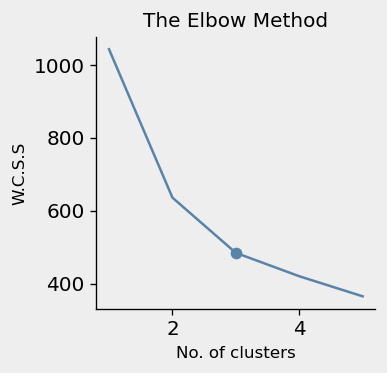

In [33]:
wcss =[]
for i in range(1, 6):
    km = KMeans(n_clusters = i, random_state = 0)
    km.fit(X_standarized)
    wcss.append(km.inertia_)

high_c = '#5a83aa'

fig, ax = plt.subplots(1,1, figsize=(3, 3),dpi=120)
fig.patch.set_facecolor(background) # figure background color

ax.plot(range(1, 6), wcss, color=high_c)
ax.scatter(x=3, y=wcss[2], c=high_c)

ax.set_facecolor(background)

for s in ['top','right']:
    ax.spines[s].set_visible(False)

ax.tick_params(axis = 'both', which = 'major', labelsize = 12)


plt.title('The Elbow Method')
plt.xlabel('No. of clusters')
plt.ylabel('W.C.S.S')

fig.show()

Seleccionaré k=3 clusters para correr el modelo. Esto clasificará en tres grupos, de acuerdo a patrones en común que existen en sus métricas, a los países reportados.

In [34]:
kmeans = KMeans(n_clusters=3)
X['Cluster'] = kmeans.fit_predict(X_standarized)
X['Cluster'] = X['Cluster'].astype('category')
dfkm_standarized['Cluster'] = X['Cluster'].astype('category')

In [35]:
dfkm_standarized.groupby('Cluster').mean().sort_values(by='Ladder score')

,Ladder score,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,Generosity,Perceptions of corruption
Cluster,,,,,,,
1,4.476000,8.108646,0.688354,57.221229,0.718375,0.050604,0.764375
0,5.735156,9.817909,0.859013,67.576000,0.801649,-0.082688,0.798922
2,6.997417,10.841875,0.925500,72.248167,0.905792,0.070125,0.424292


In [36]:
dfkm_standarized['Cluster'].value_counts()

0    77
1    48
2    24
Name: Cluster, dtype: int64

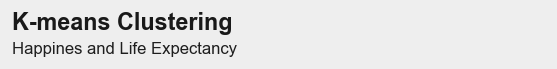

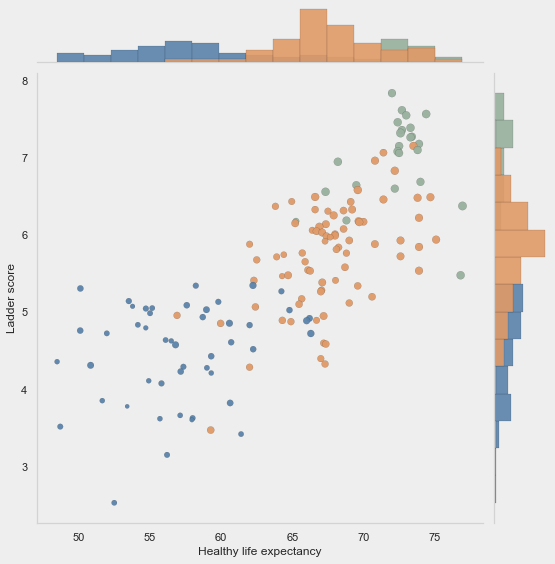

In [41]:
#fig = plt.figure(figsize=(5, 5),dpi=120)
fig, ax = plt.subplots(1,1, figsize=(5, 0.1),dpi=120)
fig.patch.set_facecolor(background) # figure background color

palette = {0:low_c,
           1:high_c,
           2:neutral_c}

# Plot

sns.set(rc={'axes.facecolor':background, 'axes.grid': False,
            'axes.edgecolor': 'lightgray',
            'figure.facecolor':background})

g = sns.JointGrid(data=dfkm_standarized, x='Healthy life expectancy', y='Ladder score', hue='Cluster',
                 ratio=7, height=8)

g.plot_joint(sns.scatterplot, alpha=.95, linewidth=0.1, ec='black',
       palette=palette, legend=False, size=dfkm_standarized['Logged GDP per capita'] * 1000)

g.plot_marginals(sns.histplot, palette=palette, bins=15, alpha=.9, linewidth=0.1, edgecolor='black')


fig.text(0.01, 1,'K-means Clustering',
        fontfamily='sans serif',fontweight='bold',fontsize=14,weight='bold',color='#191919')
    
fig.text(0.01, -1,'Happines and Life Expectancy', 
        fontsize=10, fontweight='light', fontfamily='sans serif',color='#1e1e1e')


for s in ['top','right', 'left', 'bottom']:
    ax.spines[s].set_visible(False)
    
ax.set_yticks([])
ax.set_xticks([])


fig.show()

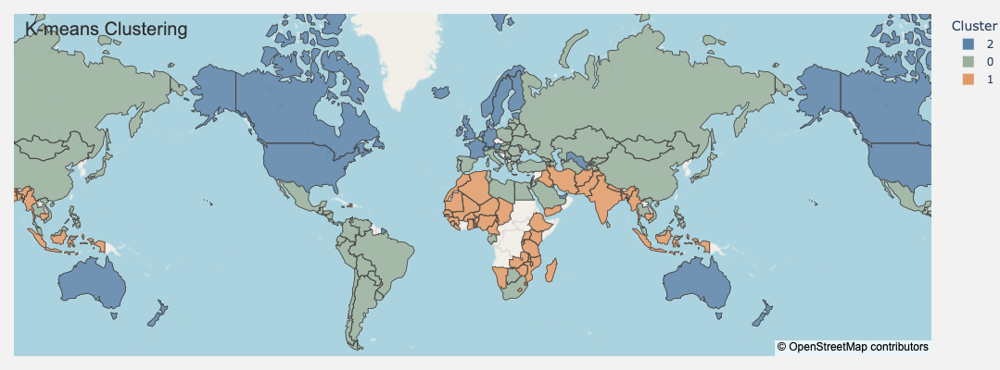

In [38]:
high_c = '#5a83aa'
low_c =  '#e09a67'
neutral_c = '#98b09d'

# Create figure
fig = px.choropleth_mapbox(
    dfkm_standarized,
    geojson=geo_world_ok,
    locations='Country',
    color=dfkm_standarized['Cluster'],
    color_discrete_sequence=[high_c, neutral_c, low_c],
    mapbox_style='open-street-map', #there are more in mapbox
    zoom=0.35,
    center={'lat': 30, 'lon': 0},
    opacity=0.85,
    title='K-means Clustering',
    labels={'Ladder score':'Happines Index'},
    height=400, #width=800  
)

fig.update_layout(margin={"r":0,"t":15,"l":15,"b":15},
                  paper_bgcolor='#f2f2f2',
                  title_font_family='Arial',
                  title_font_color='#323232',
                  title_font_size=20,
                  title_x=0.025,
                  title_y=0.94
                 )

# Display figure
fig.show()

# Conclusiones

- En general, el comportamiento del Índice sigue dinámicas regionales, encontramos ‘continentes felices’ y ‘continentes tristes’. Europa y Norte América son las regiones más felices, África y el sur de Asia son las regiones con registros más bajos. La mayoría de los países Latino Americanos y del Caribe se encuentran por encima de la media mundial.

- Desde el año 2007, los países de la parte baja de la tabla son mayormente africanos, mientras que los de la parte alta son Europeos, esto sugiere que el Índice parece seguir un patrón en el tiempo. Solo 11 países diferentes se han ubicado en el top 3 desde el año 2005, lo que sugiere una concentración en la cima de la clasificación.

- De las métricas asociadas al Índice, el ingreso per cápita, la expectativa de vida y el apoyo social son los más determinantes en la felicidad. Los países más felices son aquellos con mayores niveles de renta, expectativas de vida mayores y un solido apoyo social.

- La media mundial del Índice y sus métricas es mayor a la registrada hace diez años, lo que sugiere que hoy el mundo es un lugar más feliz, sin embargo, si se comparan las mediciones con el año 2020 hay un retroceso importante. Parece ser que tardó casi dos años desde la aparición del COVID 19 en causar los mayores efectos negativos sobre la felicidad de la población mundial. Esta afectación fue dispar a lo largo de la muestra de países, unos países alcanzaron niveles más altos de felicidad, mientras que otros sufrieron fuertes caídas, estos último jalonaron la media mundial hacía abajo. 


**Colombia.**

- Colombia se ubico en el puesto 52 del ranking, este año presentó una de las mediciones más bajas de los últimos años. En cada una de las métricas asociadas al Índice está por encima de la media mundial.

- Incluido Colombia, Latino América y el Caribe han disminuido su nivel de felicidad en los últimos diez años. Llama la atención que este descenso es generado por la caída en los países de América del Sur, mientras que los países del Caribe han incrementado su puntuación.